## TODO compare offset-subtraction to low-pass filtering

In [1]:
def init():
    from ptycho import params as p
    p.cfg['positions.provided'] = False
    p.cfg['data_source'] = 'lines'
    p.cfg['set_phi'] = False
    p.cfg['nepochs'] = 60

    p.cfg['offset'] = 4
    p.cfg['max_position_jitter'] = 3
    p.cfg['output_prefix'] = 'lines3'

    p.cfg['gridsize'] = 2
    p.cfg['n_filters_scale'] = 2
    p.cfg['object.big'] = True
    p.cfg['intensity_scale.trainable'] = True
    p.cfg['probe.trainable'] = False
    
    p.cfg['outer_offset_train'] = 8
    p.cfg['outer_offset_test'] = 20
    p.cfg['nimgs_train'] = 2
    p.cfg['nimgs_test'] = 2
    
init()
from ptycho.evaluation import save_metrics
from ptycho.evaluation import trim
from ptycho import tf_helper as hh

2023-09-06 00:48:14.634815: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-06 00:48:14.721136: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-09-06 00:48:15.099690: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/ollie/anaconda3/envs/tf/lib/
2023-09-06 00:48:15.099735: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.

In [2]:
from importlib import reload
import matplotlib.pyplot as plt

from ptycho import params as p
from ptycho import generate_data as init
# from ptycho import train

Loading result from disk cache.
Loading result from disk cache.
1.0000007
nphoton 8.962649


In [3]:
p.cfg['outer_offset_train']

8

In [4]:
p.cfg['outer_offset_test']

20

In [5]:
init.X_train.shape

(13448, 64, 64, 4)

In [6]:
from ptycho import tf_helper as hh

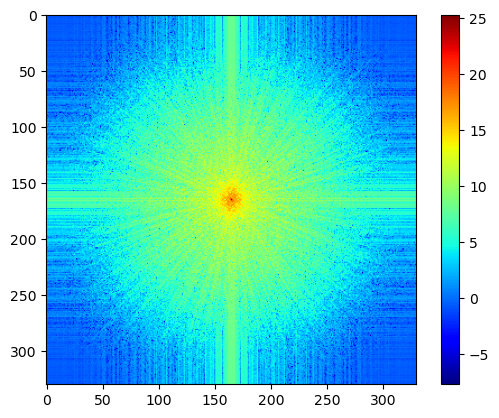

In [7]:
from ptycho import evaluation as eval
import numpy as np
reload(eval)

F2 = np.absolute(eval.fft2d(np.absolute(init.YY_ground_truth[:, :, 0])))**2

plt.imshow(np.log(F2[:, :]), cmap = 'jet')
plt.colorbar()

In [8]:
i = 2000

tmp = pred_amp

plt.imshow(np.log(np.absolute((np.absolute(pred_amp[i, :, :, 0])))**2), cmap = 'jet', vmin = 0)

NameError: name 'pred_amp' is not defined

In [9]:
plt.imshow(np.log(X_test[i, :, :, 0] + 1 / intensity_scale
), cmap = 'jet')

NameError: name 'X_test' is not defined

In [51]:
baseline_pred_I.max()

1.1525555

-7.833052788720639

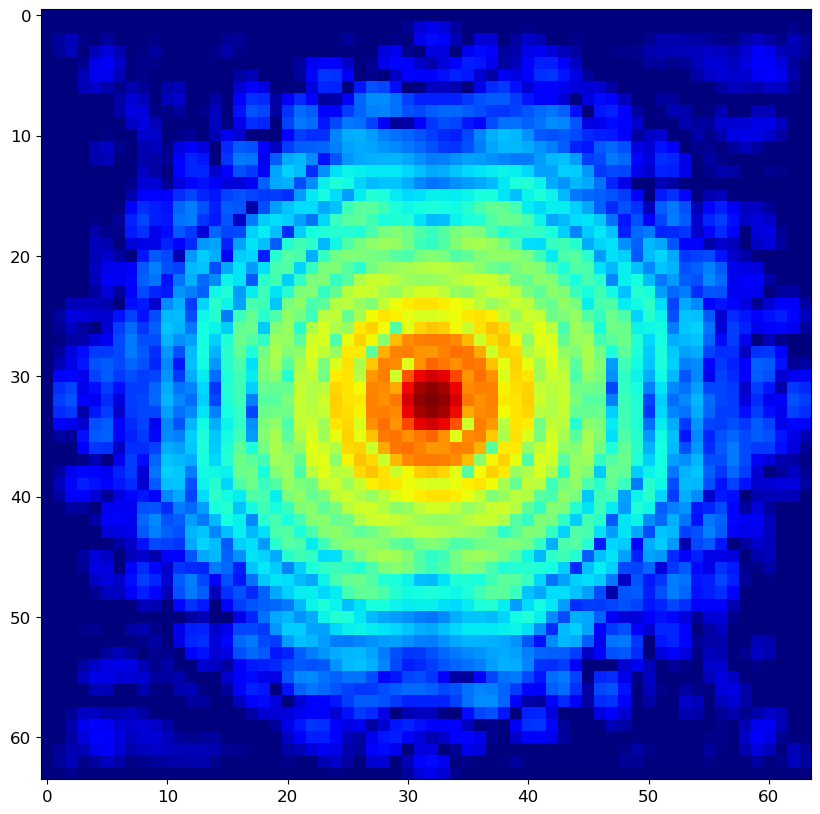

In [55]:
i = 2000

tmp = baseline_pred_I

plt.imshow(np.log(np.absolute(eval.fft2d(np.absolute(tmp[i, :, :, 0])))**2), cmap = 'jet', vmin = np.log(1 / intensity_scale))

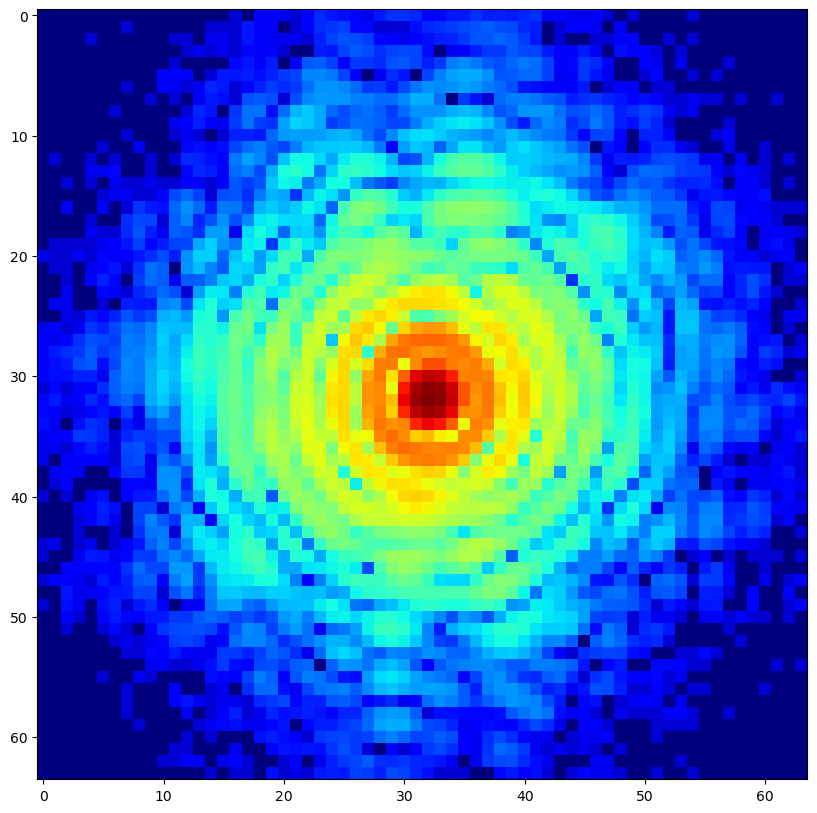

In [35]:
plt.imshow(np.log(X_test[i, :, :, 0] + 1 / intensity_scale
), cmap = 'jet')

In [8]:
size = (np.array(init.YY_ground_truth[:, :, 0]).size)

## Full PINN model, best params:

In [ ]:
from ptycho import params as p
p.cfg['data_source'] = 'lines'
p.cfg['offset'] = 4
p.cfg['max_position_jitter'] = 10
p.cfg['output_prefix'] = 'lines2'

p.cfg['gridsize'] = 2
p.cfg['n_filters_scale'] = 2
p.cfg['object.big'] = True
p.cfg['intensity_scale.trainable'] = True

from ptycho import train, model
# reload(model)
# reload(train)

# print(p.cfg)
from ptycho.train import *

input shape (None, 64, 64, 1)
Instructions for updating:
Please pass an integer value for `reinterpreted_batch_ndims`. The current behavior corresponds to `reinterpreted_batch_ndims=tf.size(distribution.batch_shape_tensor()) - 1`.
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 64, 64, 4)]  0           []                               
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 64, 64, 4)    0           ['input[0][0]']                  
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 64)   2368        ['tf.math.truediv[0][0]']        
                                                             

 padded_objs_with_offsets (Lamb  (None, None, None,   0          ['padded_obj_2[0][0]',           
 da)                            1)                                'input_positions[0][0]']        
                                                                                                  
 probe_illumination (ProbeIllum  ((None, 64, 64, 1),  4096       ['padded_objs_with_offsets[0][0]'
 ination)                        (1, 64, 64, 1))                 ]                                
                                                                                                  
 pred_amplitude (Lambda)        ((None, 64, 64, 1),  0           ['probe_illumination[0][0]']     
                                 (None, 64, 64, 1))                                               
                                                                                                  
 pred_diff_channels (Lambda)    (None, 64, 64, 4)    0           ['pred_amplitude[0][1]']         
          

2023-09-06 00:48:37.751680: I tensorflow/core/profiler/lib/profiler_session.cc:101] Profiler session initializing.
2023-09-06 00:48:37.751698: I tensorflow/core/profiler/lib/profiler_session.cc:116] Profiler session started.
2023-09-06 00:48:37.751720: I tensorflow/core/profiler/backends/gpu/cupti_tracer.cc:1664] Profiler found 1 GPUs
2023-09-06 00:48:37.754905: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcupti.so.11.2'; dlerror: libcupti.so.11.2: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/ollie/anaconda3/envs/tf/lib/
2023-09-06 00:48:37.816610: I tensorflow/core/profiler/lib/profiler_session.cc:128] Profiler session tear down.
2023-09-06 00:48:37.816712: I tensorflow/core/profiler/backends/gpu/cupti_tracer.cc:1798] CUPTI activity buffer flushed


Epoch 1/60
input shape (None, 64, 64, 1)
input shape (None, 64, 64, 1)


2023-09-06 00:48:43.103999: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-09-06 00:48:44.246195: I tensorflow/core/util/cuda_solvers.cc:179] Creating GpuSolver handles for stream 0x1ac4f700


799/799 [==============================] - 14s 13ms/step - loss: 69379336.0000 - trimmed_obj_loss: 0.0000e+00 - tf.math.multiply_loss: 12.3882 - distribution_lambda_loss: 69379336.0000 - probe_illumination_loss: 0.0720 - val_loss: 24626576.0000 - val_trimmed_obj_loss: 0.0000e+00 - val_tf.math.multiply_loss: 10.1421 - val_distribution_lambda_loss: 24626576.0000 - val_probe_illumination_loss: 0.0719 - lr: 0.0010
Epoch 2/60
799/799 [==============================] - 10s 12ms/step - loss: 22193996.0000 - trimmed_obj_loss: 0.0000e+00 - tf.math.multiply_loss: 9.7185 - distribution_lambda_loss: 22193996.0000 - probe_illumination_loss: 0.0720 - val_loss: 19583342.0000 - val_trimmed_obj_loss: 0.0000e+00 - val_tf.math.multiply_loss: 9.4598 - val_distribution_lambda_loss: 19583342.0000 - val_probe_illumination_loss: 0.0719 - lr: 0.0010
Epoch 3/60
799/799 [==============================] - 10s 12ms/step - loss: 18236802.0000 - trimmed_obj_loss: 0.0000e+00 - tf.math.multiply_loss: 9.1786 - distribu

In [5]:
from ptycho import train_pinn 

train_pinn.L2_error.shape

(69, 64, 64, 1)

In [10]:
# plt.plot(d['frc'][0])
# plt.plot(d['frc'][1])

In [5]:
d = save_metrics(stitched_obj, YY_ground_truth, label = 'PINN,NLL,overlaps')
d
#d0 = d

subtracting mean -0.4370921
subtracting mean 0.0
mean scale adjustment: 4.345142
mean scale adjustment: 4.345142
performed by index method
performed by index method
performed by index method
mean scale adjustment: 1
mean scale adjustment: 1


{'mae': (0.050260376, 0.0038945454),
 'mse': (0.004162191, 2.4341458e-05),
 'psnr': (71.93758385238337, 94.26733791899946),
 'frc50': (165, nan)}

In [4]:
d = save_metrics(stitched_obj, YY_ground_truth, label = 'PINN,NLL,overlaps')
d
#d0 = d

subtracting mean 0.01830337
subtracting mean 0.0
mean scale adjustment: 4.2948523
mean scale adjustment: 4.2948523
performed by index method
performed by index method
performed by index method
mean scale adjustment: 1
mean scale adjustment: 1


{'mae': (0.043666895, 0.0025948323),
 'mse': (0.003638167, 1.1096797e-05),
 'psnr': (72.52197695491634, 97.67882729104123),
 'frc50': (165, nan)}

In [11]:
d = save_metrics(stitched_obj, YY_ground_truth, label = 'PINN,NLL,overlaps')
d
#d0 = d

subtracting mean 0.06457644
subtracting mean 0.15387884
mean scale adjustment: 4.346844
mean scale adjustment: 4.346844
performed by index method
performed by index method
performed by index method
mean scale adjustment: 1
mean scale adjustment: 1
performed by index method
performed by index method
performed by index method


{'mae': (0.036913663, 0.014299419),
 'mse': (0.0026327244, 0.0003312106),
 'psnr': (73.9267499156581, 82.92976135806056),
 'frc50': (165, 165)}

In [14]:
d = save_metrics(stitched_obj, YY_ground_truth, label = 'PINN,NLL,overlaps')
d
#d0 = d

subtracting mean -0.18307073
subtracting mean 0.15387884
mean scale adjustment: 4.566107
mean scale adjustment: 4.566107
performed by index method
performed by index method
performed by index method
mean scale adjustment: 1
mean scale adjustment: 1
performed by index method
performed by index method
performed by index method


{'mae': (0.18717046, 0.10040524),
 'mse': (0.052955687, 0.015191995),
 'psnr': (60.89167790517977, 66.31465531094665),
 'frc50': (22, 20)}

In [12]:
stitched_phase = np.angle(stitched_obj)#init.stitch(b, 1, norm = False, nsegments = params()['nsegments'],
                       #part = 'phase')

In [8]:
tmp = p.get('probe')

In [16]:
tmp.shape

TensorShape([64, 64, 1])

In [19]:
tf.math.abs(probe.get_probe_mask()[:, :, :, 0]) * tmp

<tf.Tensor: shape=(64, 64, 1), dtype=float32, numpy=
array([[[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       ...,

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]]], dtype=float32)>

In [20]:
10 * tf.reduce_mean(tf.math.abs(tf.math.abs(probe.get_probe_mask()[:, :, :, 0]) * tmp))

<tf.Tensor: shape=(), dtype=float32, numpy=0.91796875>

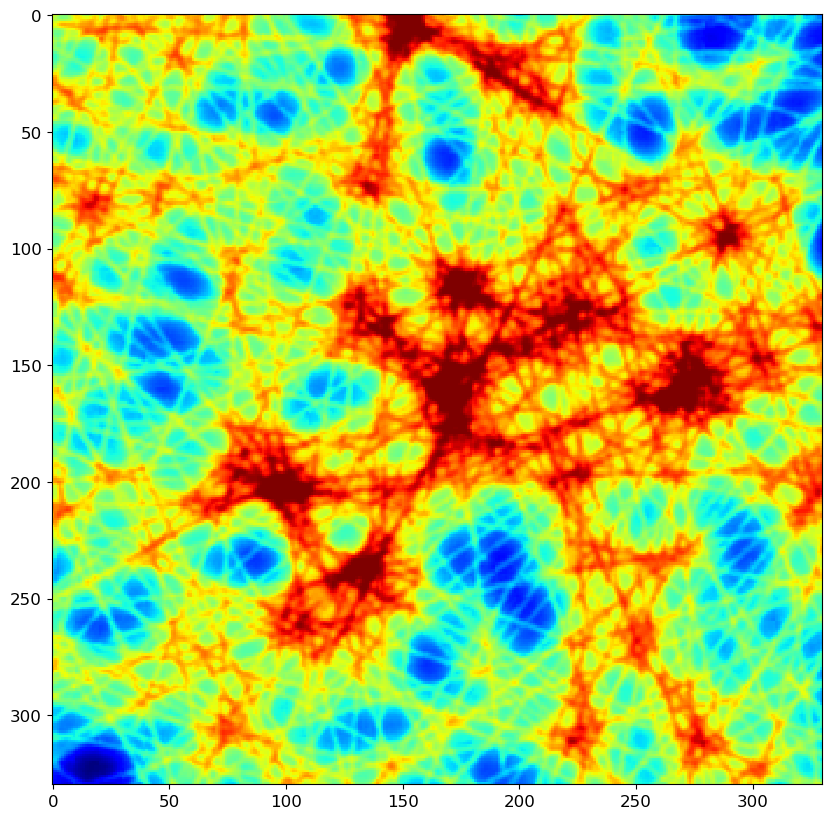

In [8]:
plt.rcParams["figure.figsize"] = (10, 10)
 
import matplotlib.pyplot as plt
plt.imshow(np.absolute(stitched_obj)[0], cmap = 'jet', interpolation='none')

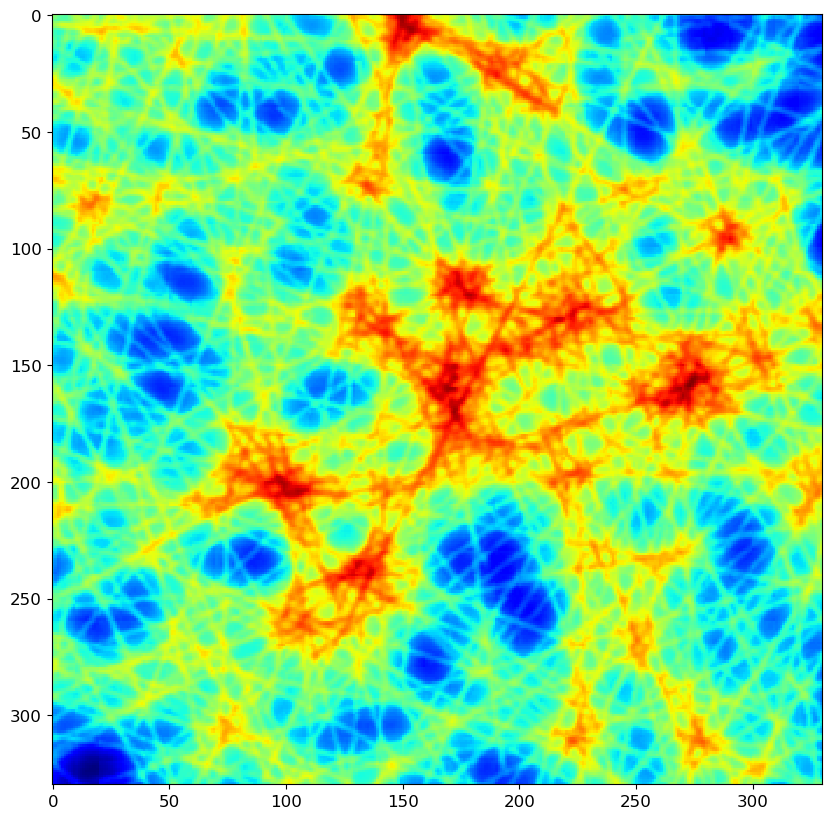

In [4]:
plt.rcParams["figure.figsize"] = (10, 10)
 
import matplotlib.pyplot as plt
plt.imshow(np.absolute(stitched_obj)[0], cmap = 'jet', interpolation='none')

phase min: -0.5068264 phase max: -0.0


/home/ollie/Documents/scratch/ptycho/notebooks/ptycho/evaluation.py:79: RuntimeWarning: divide by zero encountered in log
  true_diffraction = np.log(X_test)[i, :, :, channel]


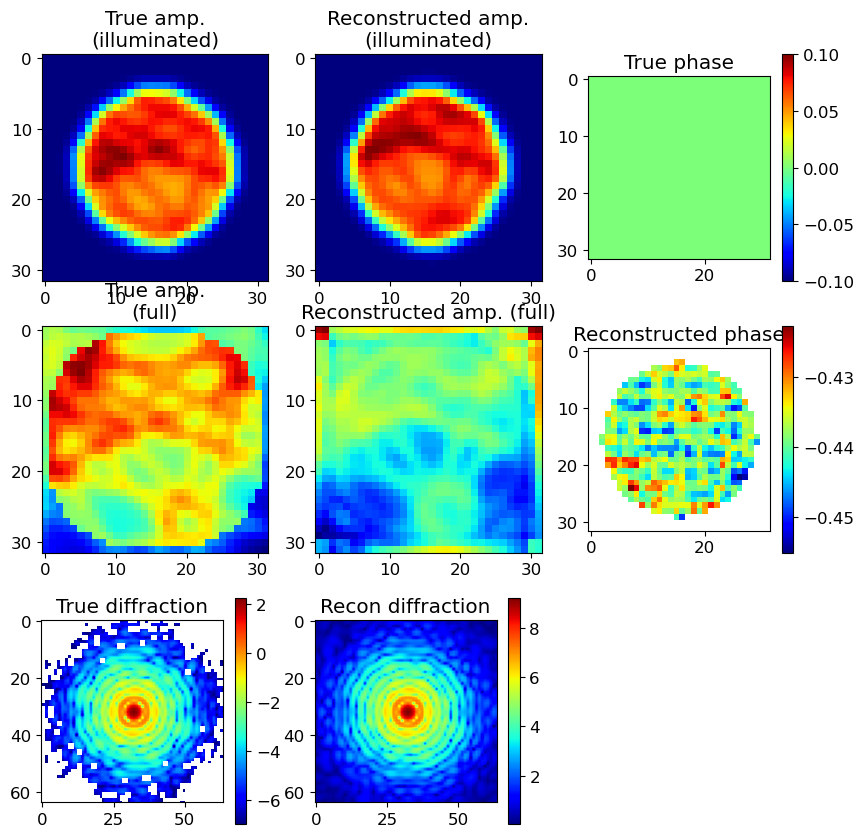

In [7]:
i = 300
from ptycho import evaluation
evaluation.summarize(i, pred_amp + 1, reconstructed_obj, X_test, Y_I_test, Y_phi_test,
                     np.absolute(p.get('probe')[:, :, 0]), 0);

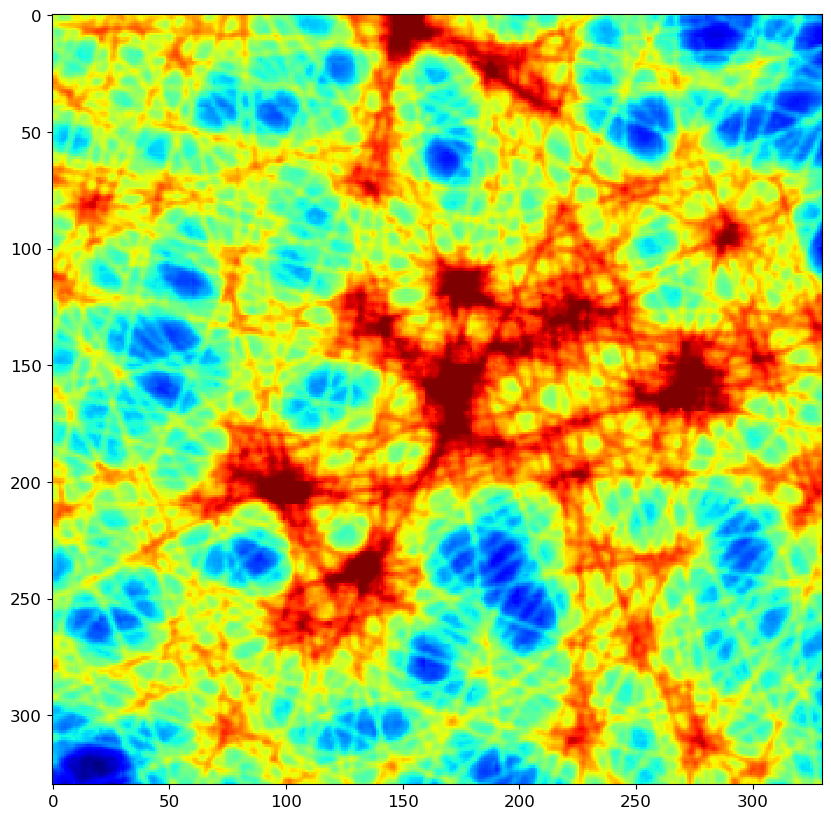

In [4]:
plt.rcParams["figure.figsize"] = (10, 10)
 
import matplotlib.pyplot as plt
plt.imshow(np.absolute(stitched_obj)[0], cmap = 'jet', interpolation='none')

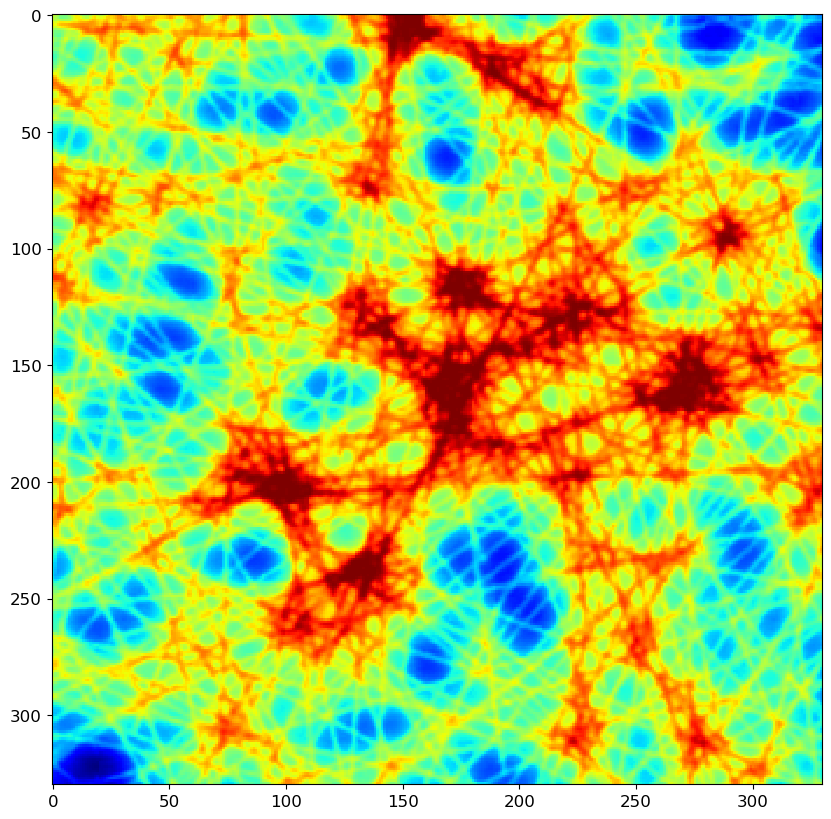

In [9]:
plt.rcParams["figure.figsize"] = (10, 10)
 
import matplotlib.pyplot as plt
plt.imshow(np.absolute(stitched_obj)[0], cmap = 'jet', interpolation='none')

In [12]:
stitched_obj.shape

(2, 330, 330, 1)

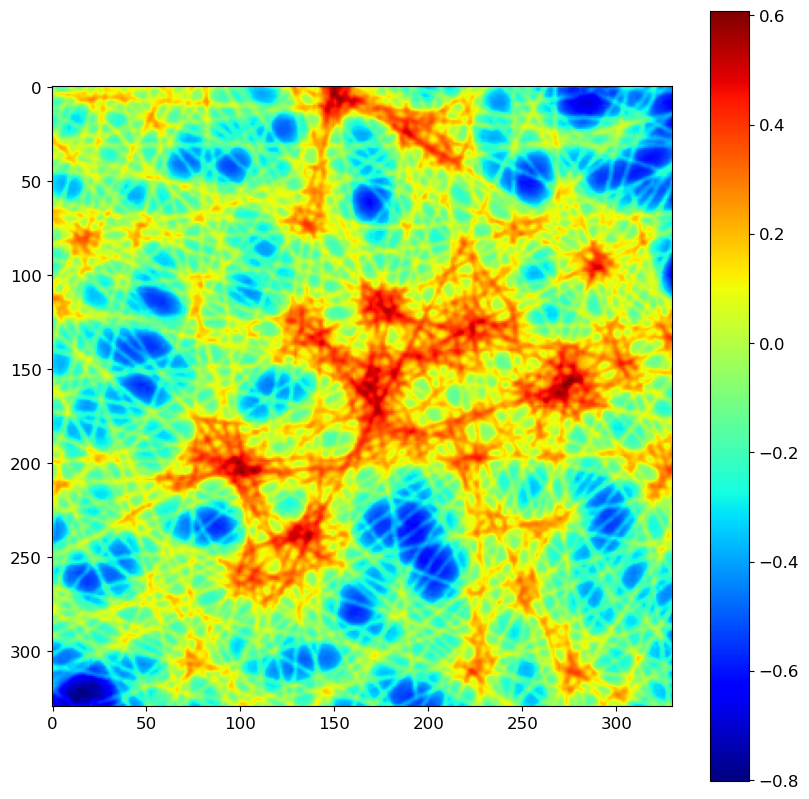

In [13]:
plt.rcParams["figure.figsize"] = (10, 10)

plt.imshow(np.angle(stitched_obj)[0], cmap = 'jet')
plt.colorbar()

In [16]:
# aphi = stitched_phase[0].squeeze()
# ns = np.linspace(1, 20).astype(int)
# maes = [mae(lowpass2d(np.squeeze(YY_phi_ground_truth), n = n), lowpass2d(aphi, n = n), normalize=False)
#         / np.absolute(lowpass2d(np.squeeze(YY_phi_ground_truth), n = n)).mean() for n in ns]
# plt.plot(ns, maes)
# n = 2
# mae(lowpass2d(np.squeeze(YY_phi_ground_truth), n = n), lowpass2d(aphi, n = n), normalize=False)
#plt.imshow(lowpass2d(np.squeeze(YY_phi_ground_truth), n = 2), cmap = 'jet', vmin = -.5, vmax = .5)

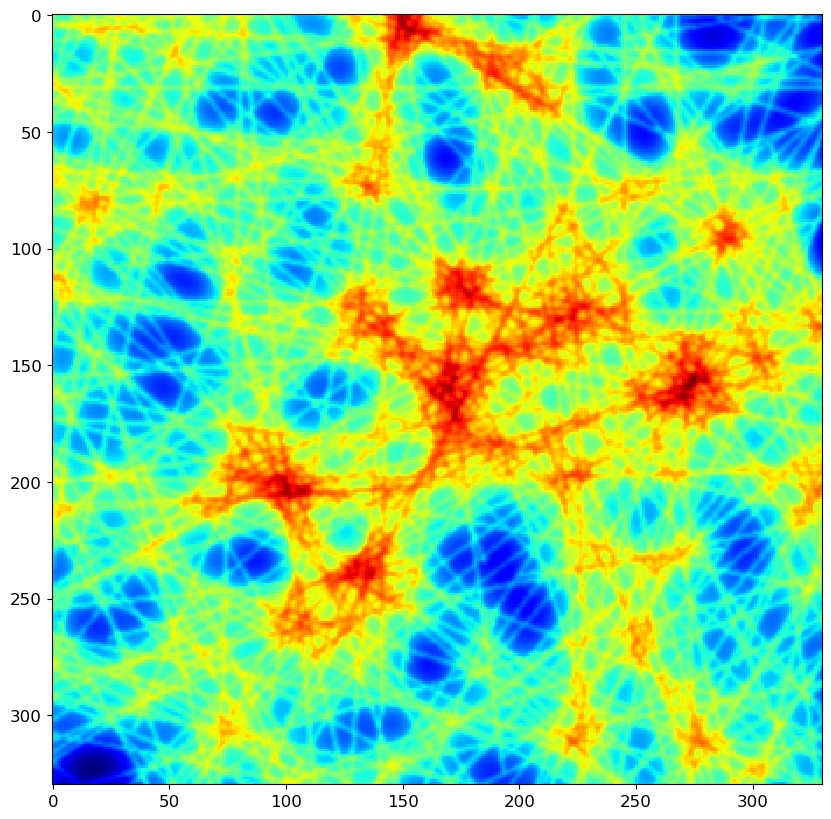

In [18]:

plt.imshow(np.absolute(init.YY_ground_truth), interpolation = 'none',
          cmap = 'jet')


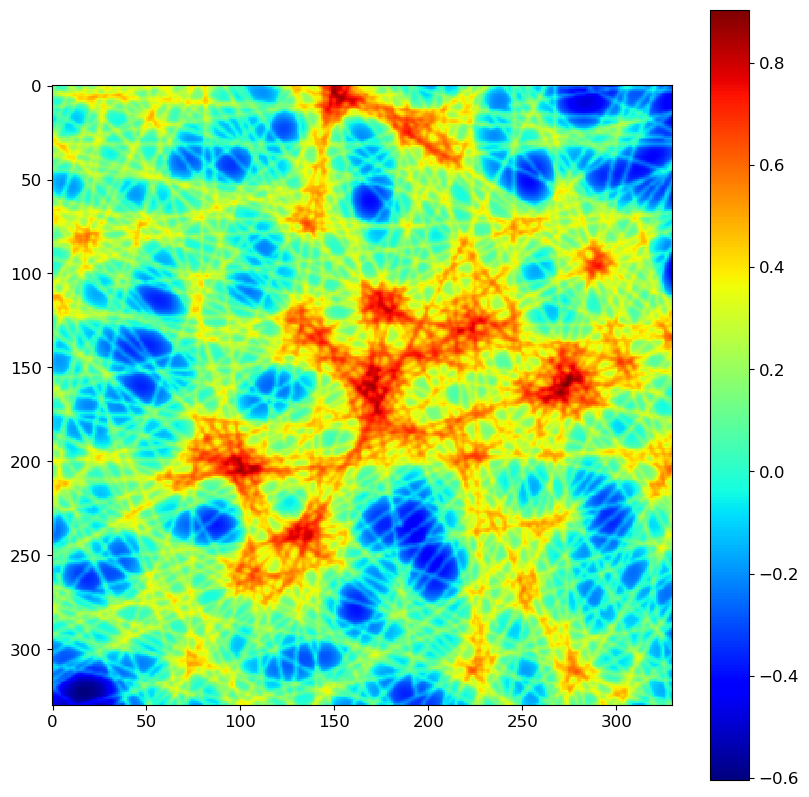

In [17]:
# vmin = np.min(YY_I_test_full[0, clipleft: -clipright, clipleft: -clipright])
# vmax = np.max(YY_I_test_full[0, clipleft: -clipright, clipleft: -clipright])
plt.imshow(np.angle(init.YY_ground_truth), interpolation = 'none',
          cmap = 'jet')
plt.colorbar()

findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


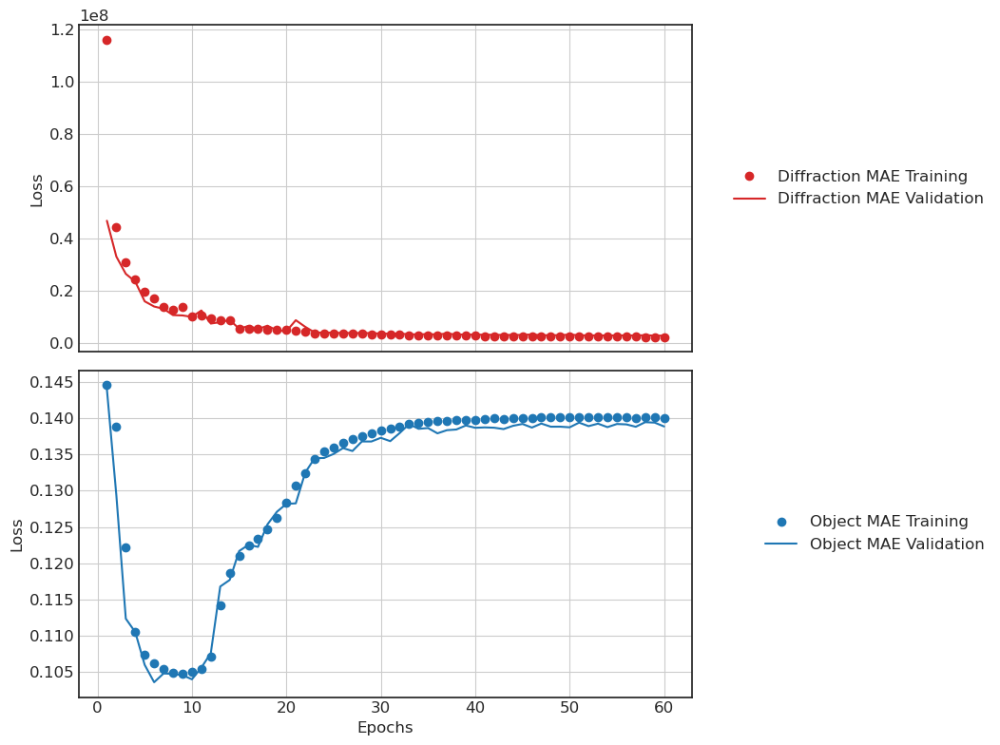

In [18]:
from ptycho import evaluation
reload(evaluation)

evaluation.plt_metrics(history, metric2 = 'trimmed_obj_loss')

In [ ]:
# %load ../ptycho/evaluation.py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import tensorflow as tf

from ptycho import params
from ptycho import misc

def recon_patches(patches):
    """
    chop channel dimension size to 1, then patch together a single image
    """
    from ptycho import generate_data as data
    return data.reassemble(patches[:, :, :, :1])[0]

def symmetrize(arr):
    return (arr + arr[::-1, ::-1]) / 2

def symmetrize_3d(arr):
    return (arr + arr[:, ::-1, ::-1]) / 2

def cropshow(arr, *args, **kwargs):
    arr = arr[16:-16, 16:-16]
    plt.imshow(arr, *args, **kwargs)

from scipy.ndimage import gaussian_filter as gf
def summarize(i, a, b, X_test, Y_I_test, Y_phi_test, probe, channel = 0):
    plt.rcParams["figure.figsize"] = (10, 10)
    vmin = 0
    vmax = np.absolute(b)[i].max()

    aa, bb = 3, 3
    plt.subplot(aa, bb, 1)
    plt.title('True amp.\n(illuminated)')
    #cropshow((Y_I_test[i]), cmap = 'jet', vmin = vmin, vmax = vmax)
    cropshow((Y_I_test[i, :, :, channel]), cmap = 'jet')

    plt.subplot(aa, bb, 2)
    plt.title('Reconstructed amp.\n(illuminated)')
#    cropshow(
#        gf((np.absolute(b))[i] * probe[..., None], .7), cmap = 'jet')
    cropshow((np.absolute(b))[i] * probe[..., None], cmap = 'jet')
#     cropshow((np.absolute(b))[i] * probe[..., None], vmin = np.min(Y_I_test[i]),
#              vmax = np.max(Y_I_test[i]), cmap = 'jet')

    plt.subplot(aa, bb, 3)
    plt.title('True phase')
    cropshow(((Y_phi_test * (probe > .01)[..., None]))[i, :, :, channel], cmap = 'jet')
    plt.colorbar()

    plt.subplot(aa, bb, 4)
    plt.title('True amp.\n(full)')
    cropshow((Y_I_test[i, :, :, channel] / (probe + 1e-9)), cmap = 'jet')

    plt.subplot(aa, bb, 5)
    plt.title('Reconstructed amp. (full)')
    #plt.imshow((np.absolute(b))[i], cmap = 'jet')
    cropshow((np.absolute(b))[i], cmap = 'jet')

    plt.subplot(aa, bb, 6)
    plt.title('Reconstructed phase')
    cropshow((np.angle(b) * (probe > .01)[..., None])[i], cmap = 'jet')
    plt.colorbar()
    print('phase min:', np.min((np.angle(b) * (probe > .01)[..., None])),
        'phase max:', np.max((np.angle(b) * (probe > .01)[..., None])))

    plt.subplot(aa, bb, 7)
    plt.title('True diffraction')
    plt.imshow(np.log(X_test)[i, :, :, channel], cmap = 'jet')

    plt.subplot(aa, bb, 8)
    plt.title('Recon diffraction')
    plt.imshow(np.log(a)[i, :, :, channel], cmap = 'jet')

def plt_metrics(history, loss_type = 'MAE', metric2 = 'padded_obj_loss'):
    hist=history
    epochs=np.asarray(history.epoch)+1

    plt.style.use('seaborn-white')
    matplotlib.rc('font',family='Times New Roman')
    matplotlib.rcParams['font.size'] = 12

    f, axarr = plt.subplots(2, sharex=True, figsize=(12, 8))

    axarr[0].set(ylabel='Loss')
    axarr[0].plot(epochs,hist.history['loss'], 'C3o', label='Diffraction {} Training'.format(loss_type))
    axarr[0].plot(epochs,hist.history['val_loss'], 'C3-', label='Diffraction {} Validation'.format(loss_type))
    axarr[0].grid()
    axarr[0].legend(loc='center right', bbox_to_anchor=(1.5, 0.5))

    axarr[1].set(ylabel='Loss')
    axarr[1].plot(epochs,hist.history[metric2], 'C0o', label='Object {} Training'.format(loss_type))
    axarr[1].plot(epochs,hist.history['val_' + metric2], 'C0-', label='Object {} Validation'.format(loss_type))
    axarr[1].legend(loc='center right', bbox_to_anchor=(1.5, 0.5))
    plt.xlabel('Epochs')
    plt.tight_layout()
    #plt.semilogy()
    axarr[1].grid()

import scipy.fftpack as fftpack
fp = fftpack

def trim(arr2d):
    offset = params.get('offset')
    assert not (offset % 2)
    return arr2d[offset // 2:-offset // 2, offset // 2:-offset // 2]

def mae(target, pred, normalize = True):
    """
    mae for an entire (stitched-together) reconstruction.
    """
    if normalize:
        scale = np.mean(target) / np.mean(pred)
    else:
        scale = 1
    print('mean scale adjustment:', scale)
    return np.mean(np.absolute(target - scale * pred))

def mse(target, pred, normalize = True):
    """
    mae for an entire (stitched-together) reconstruction.
    """
    if normalize:
        scale = np.mean(target) / np.mean(pred)
    else:
        scale = 1
    print('mean scale adjustment:', scale)
    return np.mean((target - scale * pred)**2)

def psnr(target, pred, normalize = True, shift = False):
    """
    for phase inputs, assume that global shift has already been taken care off
    """
    import cv2
    target = np.array(target)
    pred = np.array(pred)
    if normalize:
        scale = np.mean(target) / np.mean(pred)
    else:
        scale = 1
    if shift:
        offset = min(np.min(target), np.min(pred))
        target = target - offset
        pred = pred - offset
    pred = scale * pred
    return cv2.PSNR(target, pred)

def fft2d(aphi):
    F1 = fftpack.fft2((aphi).astype(float))
    F2 = fftpack.fftshift(F1)
    return F2

def highpass2d(aphi, n = 2):
    if n == 1:
        print('subtracting mean', np.mean(aphi))
        return aphi - np.mean(aphi)
    F2 = fft2d(aphi)
    (w, h) = aphi.shape
    half_w, half_h = int(w/2), int(h/2)

    # high pass filter

    F2[half_w-n:half_w+n+1,half_h-n:half_h+n+1] = 0

    im1 = fp.ifft2(fftpack.ifftshift(F2)).real
    return im1

def lowpass2d(aphi, n = 2):
    if n == 1:
        print('subtracting mean', np.mean(aphi))
        return aphi - np.mean(aphi)
    F2 = fft2d(aphi)
    (w, h) = aphi.shape
    half_w, half_h = int(w/2), int(h/2)

    # high pass filter
    mask = np.zeros_like(F2)
    mask[half_w-n:half_w+n+1,half_h-n:half_h+n+1] = 1.
    F2 = F2 * mask

    im1 = fp.ifft2(fftpack.ifftshift(F2)).real
    return im1

def frc50(target, pred, sigma = 2):
    if np.isnan(pred).all():
        raise ValueError
    if np.max(target) == np.min(target) == 0:
        return None, np.nan
    from FRC import fourier_ring_corr as frc
    shellcorr = frc.FSC(np.array(target), np.array(pred))
    shellcorr = gf(shellcorr, sigma)
    return shellcorr, np.where(shellcorr < .5)[0][0]


#def eval_reconstruction(stitched_obj, ground_truth_obj, lowpass_n = 1,
#        label = ''):
#    assert np.ndim(stitched_obj) == np.ndim(ground_truth_obj), \
#        'stitched_obj and ground_truth_obj must have the same number of dimensions'
#    assert stitched_obj.shape[1] == ground_truth_obj.shape[1]
#
#    YY_ground_truth = np.absolute(ground_truth_obj)
#    YY_phi_ground_truth = np.angle(ground_truth_obj)
#
#    if np.ndim(stitched_obj) == 3:
#        phi_pred = trim(
#            highpass2d(
#                np.squeeze(np.angle(stitched_obj)[0]), n = lowpass_n
#            )
#        )
#        amp_pred = trim(np.absolute(stitched_obj)[0])
#    else:  # If it's 2D
#        phi_pred = trim(
#            highpass2d(
#                np.squeeze(np.angle(stitched_obj)), n = lowpass_n
#            )
#        )
#        amp_pred = trim(np.absolute(stitched_obj))
#
#    phi_target = trim(
#        highpass2d(
#            np.squeeze(YY_phi_ground_truth), n = lowpass_n
#        )
#    )
#    amp_target = tf.cast(trim(YY_ground_truth), tf.float32)

def eval_reconstruction(stitched_obj, ground_truth_obj, lowpass_n = 1,
        label = ''):
    # TODO consistent shapes
    assert stitched_obj.shape[1] == ground_truth_obj.shape[1]
    assert np.ndim(ground_truth_obj) == 3
    assert int(np.ndim(stitched_obj)) in [3, 4]
    if np.ndim(stitched_obj) == 4:
        stitched_obj = stitched_obj[0]
    YY_ground_truth = np.absolute(ground_truth_obj)
    YY_phi_ground_truth = np.angle(ground_truth_obj)

    phi_pred = trim(
        highpass2d(
            np.squeeze(np.angle(stitched_obj)), n = lowpass_n
        )
    )
    phi_target = trim(
        highpass2d(
            np.squeeze(YY_phi_ground_truth), n = lowpass_n
        )
    )
    amp_target = tf.cast(trim(YY_ground_truth), tf.float32)
    amp_pred = trim(np.absolute(stitched_obj))

    # TODO complex FRC?
    mae_amp = mae(amp_target, amp_pred) # PINN
    mse_amp = mse(amp_target, amp_pred) # PINN
    psnr_amp = psnr(amp_target[:, :, 0], amp_pred[:, :, 0], normalize = True,
        shift = False)
    frc_amp, frc50_amp = frc50(amp_target[:, :, 0], amp_pred[:, :, 0])

    mae_phi = mae(phi_target, phi_pred, normalize=False) # PINN
    mse_phi = mse(phi_target, phi_pred, normalize=False) # PINN
    psnr_phi = psnr(phi_target, phi_pred, normalize = False, shift = True)
    frc_phi, frc50_phi = frc50(phi_target, phi_pred)

    return {'mae': (mae_amp, mae_phi),
        'mse': (mse_amp, mse_phi),
        'psnr': (psnr_amp, psnr_phi),
        'frc50': (frc50_amp, frc50_phi),
        'frc': (frc_amp, frc_phi)}



#def eval_reconstruction(stitched_obj, ground_truth_obj, lowpass_n = 1,
#        label = ''):
#    assert stitched_obj.shape[1] == ground_truth_obj.shape[1]
#    YY_ground_truth = np.absolute(ground_truth_obj)
#    YY_phi_ground_truth = np.angle(ground_truth_obj)
#
#    phi_pred = trim(
#        highpass2d(
#            np.squeeze(np.angle(stitched_obj)[0]), n = lowpass_n
#        )
#    )
#    phi_target = trim(
#        highpass2d(
#            np.squeeze(YY_phi_ground_truth), n = lowpass_n
#        )
#    )
#    amp_target = tf.cast(trim(YY_ground_truth), tf.float32)
#    amp_pred = trim(np.absolute(stitched_obj)[0])
#
#    # TODO complex FRC?
#    mae_amp = mae(amp_target, amp_pred) # PINN
#    mse_amp = mse(amp_target, amp_pred) # PINN
#    psnr_amp = psnr(amp_target[:, :, 0], amp_pred[:, :, 0], normalize = True,
#        shift = False)
#    frc_amp, frc50_amp = frc50(amp_target[:, :, 0], amp_pred[:, :, 0])
#
#    mae_phi = mae(phi_target, phi_pred, normalize=False) # PINN
#    mse_phi = mse(phi_target, phi_pred, normalize=False) # PINN
#    psnr_phi = psnr(phi_target, phi_pred, normalize = False, shift = True)
#    frc_phi, frc50_phi = frc50(phi_target, phi_pred)
#
#    return {'mae': (mae_amp, mae_phi),
#        'mse': (mse_amp, mse_phi),
#        'psnr': (psnr_amp, psnr_phi),
#        'frc50': (frc50_amp, frc50_phi),
#        'frc': (frc_amp, frc_phi)}
#
import pandas as pd
import os
import dill
def save_metrics(stitched_obj, YY_ground_truth,  label = ''):
    """
    evaluate reconstruction and save the result to disk.
    """
    out_prefix = misc.get_path_prefix()
    os.makedirs(out_prefix, exist_ok=True)
    metrics = eval_reconstruction(stitched_obj, YY_ground_truth, label = label)
    metrics['label'] = label
    d = {**params.cfg, **metrics}
    with open(out_prefix + '/params.dill', 'wb') as f:
        dill.dump(d, f)
    df = pd.DataFrame({k: d[k] for k in ['mae', 'mse', 'psnr', 'frc50']})
    df.to_csv(out_prefix + '/metrics.csv')
    return {k: metrics[k] for k in ['mae', 'mse', 'psnr', 'frc50']}


In [22]:
reload(evaluation)

<module 'ptycho.evaluation' from '/home/ollie/Documents/scratch/ptycho/notebooks/ptycho/evaluation.py'>

phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665
phase min: -0.8894334 phase max: 0.6573665


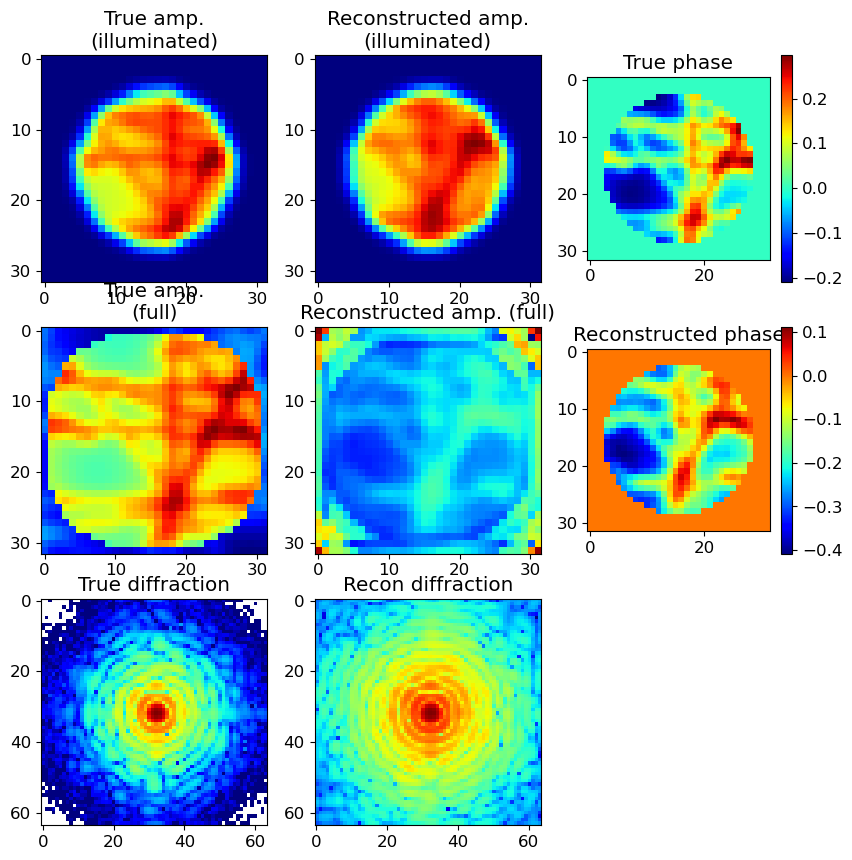

In [30]:
from ptycho import evaluation
ptychopinn_heatmaps = [evaluation.summarize(i, pred_amp, reconstructed_obj, X_test, Y_I_test, Y_phi_test, probe.probe, 0) for i in idxs]

In [24]:
d

{'true_amp_illuminated': array([[8.2390694e-10, 8.2922774e-10, 8.4742469e-10, ..., 3.9758385e-10,
         4.0102743e-10, 4.1992609e-10],
        [8.6869206e-10, 8.7754587e-10, 8.8626784e-10, ..., 3.8743309e-10,
         3.9521469e-10, 4.1478143e-10],
        [8.8213314e-10, 8.8451863e-10, 8.9259072e-10, ..., 3.8354298e-10,
         3.9183021e-10, 4.1124532e-10],
        ...,
        [8.7216379e-10, 8.7065699e-10, 8.8078245e-10, ..., 7.9735835e-10,
         7.7444068e-10, 7.7940293e-10],
        [8.6882107e-10, 8.6158364e-10, 8.8218638e-10, ..., 7.6941803e-10,
         7.6041501e-10, 7.6828122e-10],
        [8.2709262e-10, 8.2452795e-10, 8.7403323e-10, ..., 7.5173567e-10,
         7.7267576e-10, 7.7398138e-10]], dtype=float32),
 'rec_amp_illuminated': array([[[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],
 
        [[0.],
         [0.],
         [0.],
         ...,
         [0.],
         [0.],
         [0.]],
 
        [[0.],
         [

## With MAE instead of NLL

In [3]:
init()

from importlib import reload
import matplotlib.pyplot as plt
from ptycho import params as p

p.cfg['offset'] = 4

# Swap NLL and MAE weights
p.cfg['nll_weight'] = 0.
p.cfg['mae_weight'] = 1.
p.cfg['intensity_scale.trainable'] = True
p.cfg['object.big'] = True
p.cfg['n_filters_scale'] = 2


from ptycho import train, model
# reload(model)
# reload(train)

p.cfg
from ptycho.train import *

/home/ollie/anaconda3/envs/tf/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
2023-05-05 21:41:56.008806: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


offset 4


2023-05-05 21:41:56.105098: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-05-05 21:41:56.425188: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/ollie/anaconda3/envs/tf/lib/:/home/ollie/anaconda3/envs/tf/lib/
2023-05-05 21:41:56.425233: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/ollie/anaconda3/envs/tf/lib/:/home/ollie/anaconda3/envs/tf/lib/
2023-05-05 21:41:56.425237: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would li

is test: False
is test: False
is test: False
is test: False
simulating gaussian position jitter, scale 0.0
Using provided scan point offsets
is test: False
is test: False
input shape (None, 64, 64, 1)
Instructions for updating:
Please pass an integer value for `reinterpreted_batch_ndims`. The current behavior corresponds to `reinterpreted_batch_ndims=tf.size(distribution.batch_shape_tensor()) - 1`.
is test: False
is test: False
is test: False
is test: False
simulating gaussian position jitter, scale 0.0
Using provided scan point offsets
is test: False
is test: False
1.0000093
nphoton 8.964053
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 64, 64, 4)]  0           []                               
                                                                                      

                                                                                                  
 pred_amplitude (Lambda)        ((None, 64, 64, 1),  0           ['probe_illumination[0][0]']     
                                 (None, 64, 64, 1))                                               
                                                                                                  
 pred_diff_channels (Lambda)    (None, 64, 64, 4)    0           ['pred_amplitude[0][1]']         
                                                                                                  
 intensity_scaler_inv (Intensit  (None, 64, 64, 4)   1           ['pred_diff_channels[0][0]']     
 yScaler_inv)                                                                                     
                                                                                                  
 trimmed_obj (Lambda)           (None, 64, 64, 1)    0           ['padded_obj_2[0][0]']           
          

2023-05-05 21:43:22.946054: I tensorflow/core/profiler/lib/profiler_session.cc:101] Profiler session initializing.
2023-05-05 21:43:22.946070: I tensorflow/core/profiler/lib/profiler_session.cc:116] Profiler session started.
2023-05-05 21:43:22.946091: I tensorflow/core/profiler/backends/gpu/cupti_tracer.cc:1664] Profiler found 1 GPUs
2023-05-05 21:43:22.949005: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcupti.so.11.2'; dlerror: libcupti.so.11.2: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/ollie/anaconda3/envs/tf/lib/:/home/ollie/anaconda3/envs/tf/lib/
2023-05-05 21:43:23.002342: I tensorflow/core/profiler/lib/profiler_session.cc:128] Profiler session tear down.
2023-05-05 21:43:23.002667: I tensorflow/core/profiler/backends/gpu/cupti_tracer.cc:1798] CUPTI activity buffer flushed


Epoch 1/60


2023-05-05 21:43:28.764413: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-05-05 21:43:29.878031: I tensorflow/core/util/cuda_solvers.cc:179] Creating GpuSolver handles for stream 0x843bb70


732/732 [==============================] - 13s 14ms/step - loss: 17.1688 - trimmed_obj_loss: 0.1499 - intensity_scaler_inv_loss: 17.1688 - distribution_lambda_loss: 136312512.0000 - probe_illumination_loss: 0.0306 - val_loss: 14.0426 - val_trimmed_obj_loss: 0.1440 - val_intensity_scaler_inv_loss: 14.0426 - val_distribution_lambda_loss: 51449260.0000 - val_probe_illumination_loss: 0.0314 - lr: 0.0010
Epoch 2/60
732/732 [==============================] - 9s 13ms/step - loss: 13.7632 - trimmed_obj_loss: 0.1307 - intensity_scaler_inv_loss: 13.7632 - distribution_lambda_loss: 48217048.0000 - probe_illumination_loss: 0.0306 - val_loss: 12.5904 - val_trimmed_obj_loss: 0.1195 - val_intensity_scaler_inv_loss: 12.5904 - val_distribution_lambda_loss: 35569644.0000 - val_probe_illumination_loss: 0.0314 - lr: 0.0010
Epoch 3/60
732/732 [==============================] - 9s 13ms/step - loss: 12.5816 - trimmed_obj_loss: 0.1148 - intensity_scaler_inv_loss: 12.5816 - distribution_lambda_loss: 36293740.0

Epoch 39/60
728/732 [============================>.] - ETA: 0s - loss: 4.7838 - trimmed_obj_loss: 0.1276 - intensity_scaler_inv_loss: 4.7838 - distribution_lambda_loss: 2685791.2500 - probe_illumination_loss: 0.0306
Epoch 39: ReduceLROnPlateau reducing learning rate to 0.0001.
732/732 [==============================] - 9s 13ms/step - loss: 4.7842 - trimmed_obj_loss: 0.1277 - intensity_scaler_inv_loss: 4.7842 - distribution_lambda_loss: 2686052.0000 - probe_illumination_loss: 0.0306 - val_loss: 5.1757 - val_trimmed_obj_loss: 0.1265 - val_intensity_scaler_inv_loss: 5.1757 - val_distribution_lambda_loss: 3245737.7500 - val_probe_illumination_loss: 0.0314 - lr: 1.2500e-04
Epoch 40/60
732/732 [==============================] - 9s 13ms/step - loss: 4.7427 - trimmed_obj_loss: 0.1275 - intensity_scaler_inv_loss: 4.7427 - distribution_lambda_loss: 2628953.0000 - probe_illumination_loss: 0.0306 - val_loss: 5.1534 - val_trimmed_obj_loss: 0.1267 - val_intensity_scaler_inv_loss: 5.1534 - val_distri

In [6]:
d = save_metrics(stitched_obj, YY_ground_truth, label = 'PINN,overlaps')
d

offset 4
subtracting mean 0.033093464
subtracting mean 0.15206575
mean scale adjustment: 1.5066053
mean scale adjustment: 1.5066053
performed by index method
performed by index method
performed by index method
mean scale adjustment: 1
mean scale adjustment: 1
performed by index method
performed by index method
performed by index method


{'mae': (0.007836337, 0.023081424),
 'mse': (0.0001007804, 0.0008726568),
 'psnr': (60.83673646123422, 78.72236923547972),
 'frc50': (169, 169)}

In [9]:
pinn_ol_mae_score = mae(trim(YY_ground_truth), trim(reassemble(b)[0])) 
pinn_ol_mae_score

mean scale adjustment: (1.4316943+0.30538684j)


0.13031165

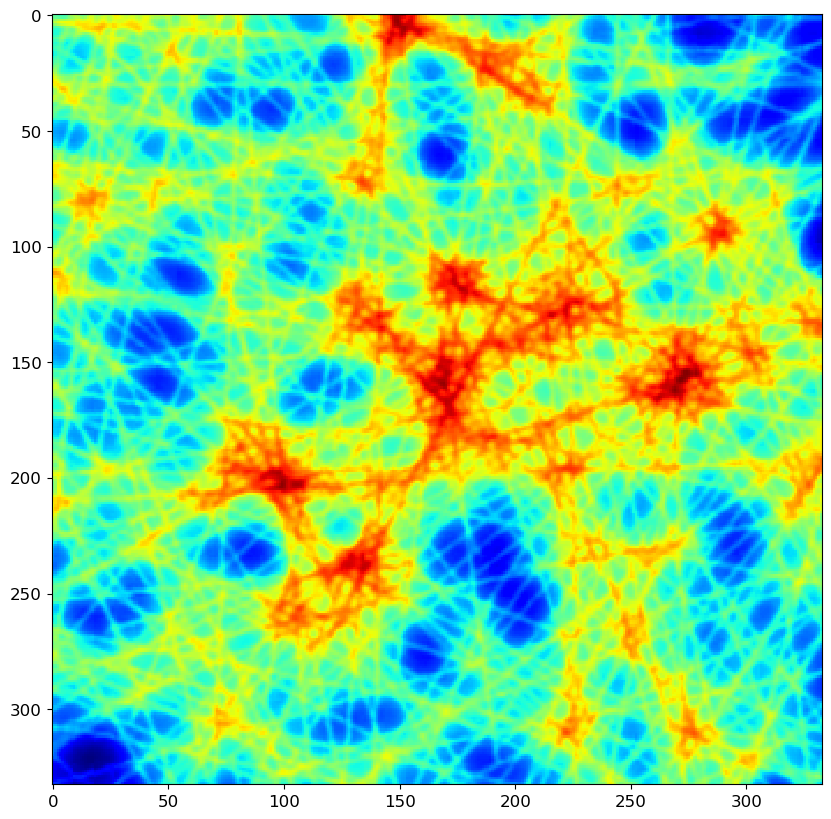

In [10]:
plt.rcParams["figure.figsize"] = (10, 10)


plt.imshow(np.absolute(stitched_obj)[0], interpolation = 'none', cmap = 'jet')

phase min: -0.77840626 phase max: 0.7535324


/home/ollie/Documents/scratch/ptycho/notebooks/ptycho/evaluation.py:69: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(X_test)[i, :, :, channel], cmap = 'jet')


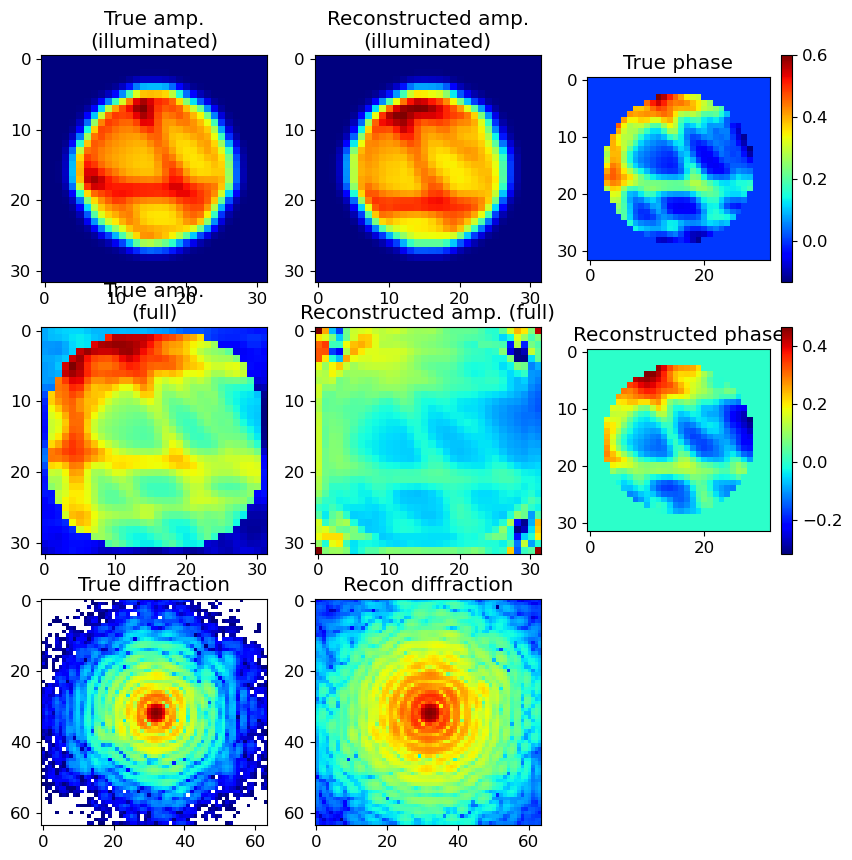

In [11]:
# Offset 4, jitter = 0 val_loss: 2625558.
from ptycho import evaluation
evaluation.summarize(10, a, b, X_test, Y_I_test, Y_phi_test, probe.probe, 2)

## PtychoNN with overlaps

In [12]:
from importlib import reload
import matplotlib.pyplot as plt

from ptycho import params as p

p.cfg['model_type'] = 'supervised'
p.cfg['data_source'] = 'lines'
p.cfg['n_filters_scale'] = 1
p.cfg['gridsize'] = 2

# reload(init.datasets)
# reload(init)
from ptycho.generate_data import *

In [13]:
baseline_model_overlap = bl.train((X_train[:, :, :, :4]),
                          Y_I_train[:, :, :, :4], Y_phi_train[:, :, :, :4])

baseline_overlap_pred_I, baseline_overlap_pred_phi = baseline_model_overlap.predict(
    [X_test[:, :, :, :4]  * bl.params.params()['intensity_scale']])
baseline_overlap_stitched = stitch(baseline_overlap_pred_I[:, :, :, :1], norm_Y_I_test)


# For comparison to the 'baseline' model (PtychoNN) we need to crop/shift in a different way
def xyshift(arr4d, dx, dy):
    assert len(arr4d.shape) == 4
    from scipy.ndimage.interpolation import shift
    arr4d = np.roll(arr4d, dx, axis = 1)
    arr4d = np.roll(arr4d, dy, axis = 2)
    return arr4d

YY_baseline_overlap = xyshift(baseline_overlap_stitched, -2, -2)
YY_phi_baseline_overlap = xyshift(stitch(baseline_overlap_pred_phi[:, :, :, :1], 1), -2, -2)
stitched_obj = hh.combine_complex(YY_baseline_overlap, YY_phi_baseline_overlap)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 4)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 64)   2368        ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 64, 64, 64)   36928       ['conv2d[0][0]']                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 32, 32, 64)   0           ['conv2d_1[0][0]']               
                                                                                              

Epoch 41/60
366/366 [==============================] - 8s 22ms/step - loss: 0.0768 - conv2d_12_loss: 0.0027 - conv2d_19_loss: 0.0741 - val_loss: 0.1536 - val_conv2d_12_loss: 0.0028 - val_conv2d_19_loss: 0.1508 - lr: 1.0000e-04
Epoch 42/60
366/366 [==============================] - 8s 22ms/step - loss: 0.0760 - conv2d_12_loss: 0.0026 - conv2d_19_loss: 0.0733 - val_loss: 0.1539 - val_conv2d_12_loss: 0.0028 - val_conv2d_19_loss: 0.1511 - lr: 1.0000e-04
Epoch 43/60
366/366 [==============================] - 8s 22ms/step - loss: 0.0753 - conv2d_12_loss: 0.0026 - conv2d_19_loss: 0.0727 - val_loss: 0.1536 - val_conv2d_12_loss: 0.0028 - val_conv2d_19_loss: 0.1508 - lr: 1.0000e-04
Epoch 44/60
366/366 [==============================] - 8s 22ms/step - loss: 0.0745 - conv2d_12_loss: 0.0026 - conv2d_19_loss: 0.0719 - val_loss: 0.1537 - val_conv2d_12_loss: 0.0028 - val_conv2d_19_loss: 0.1509 - lr: 1.0000e-04
Epoch 45/60
366/366 [==============================] - 8s 22ms/step - loss: 0.0738 - conv2d_

NameError: name 'hh' is not defined

In [18]:
YY_baseline_overlap = xyshift(baseline_overlap_stitched, -2, -2)
YY_phi_baseline_overlap = xyshift(stitch(baseline_overlap_pred_phi[:, :, :, :1], 1), -2, -2)
stitched_obj = hh.combine_complex(YY_baseline_overlap, YY_phi_baseline_overlap)

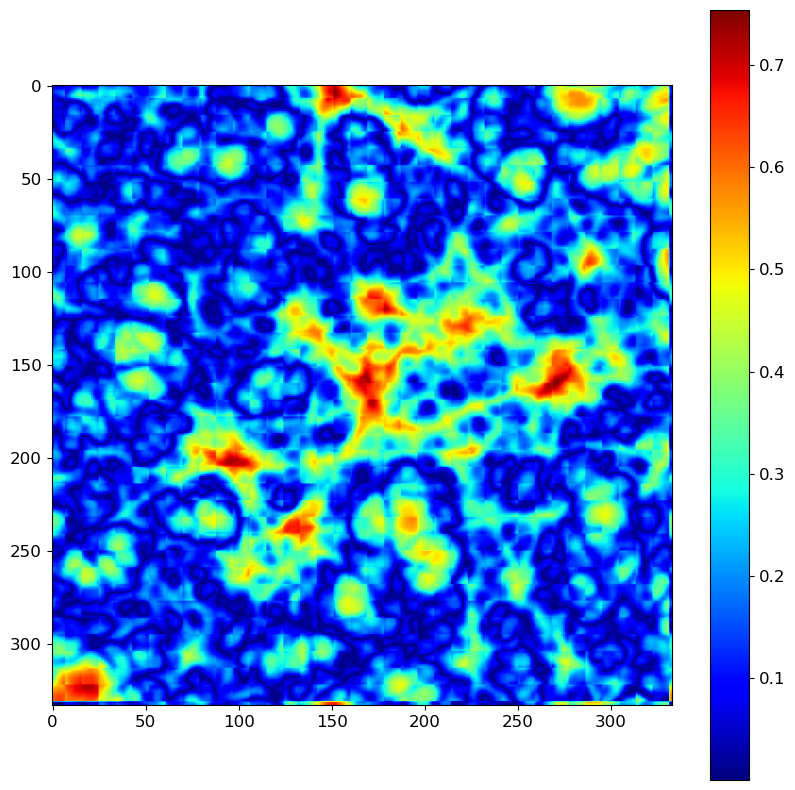

In [19]:
plt.imshow(np.angle(stitched_obj[0]),
          cmap = 'jet')
plt.colorbar()

In [20]:
d = save_metrics(stitched_obj, YY_ground_truth, label = 'overlaps')
d

offset 4
subtracting mean 0.19369668
subtracting mean 0.15206575
mean scale adjustment: 0.23170123
mean scale adjustment: 0.23170123
performed by index method
performed by index method
performed by index method
mean scale adjustment: 1
mean scale adjustment: 1
performed by index method
performed by index method
performed by index method


{'mae': (0.026895246, 0.18947484),
 'mse': (0.0011265521, 0.062229842),
 'psnr': (40.9671519453611, 60.190816065466294),
 'frc50': (48, 2)}

In [ ]:
#mark

In [33]:
stitched_obj = hh.combine_complex(YY_baseline_overlap, YY_phi_baseline_overlap)

In [36]:
YY_ground_truth.shape, YY_baseline_overlap.shape

(TensorShape([333, 333, 1]), (3, 333, 333, 1))

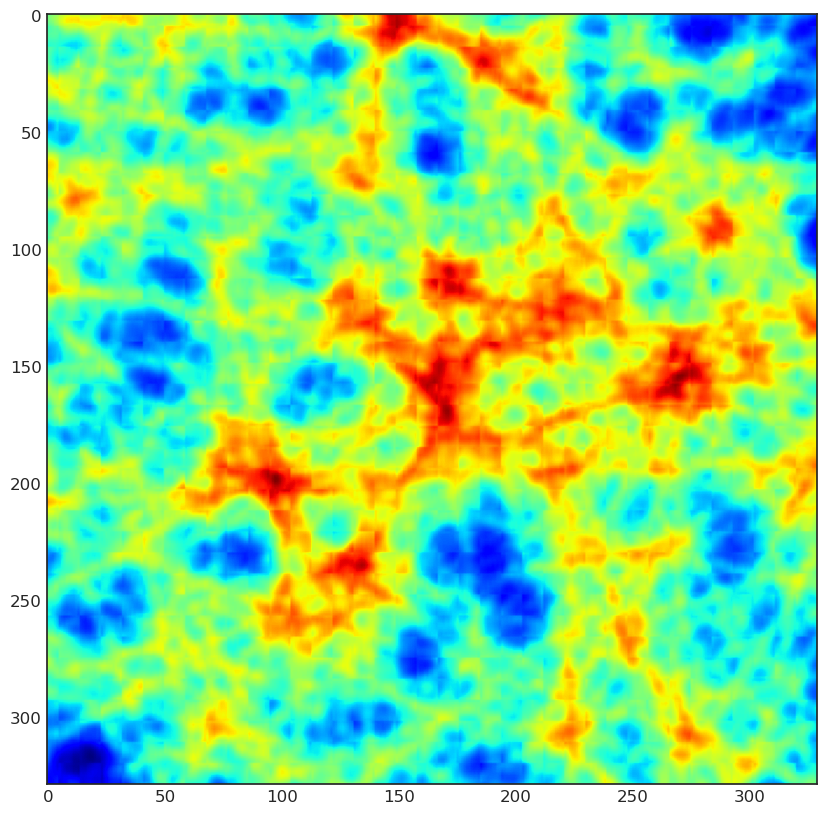

In [37]:
plt.rcParams["figure.figsize"] = (10, 10)

plt.imshow(trim(YY_baseline_overlap[0]), cmap = 'jet')
# plt.title('MAE = {0:.3f}'.format(
#     mae(trim(YY_ground_truth), trim(YY_baseline_overlap))))

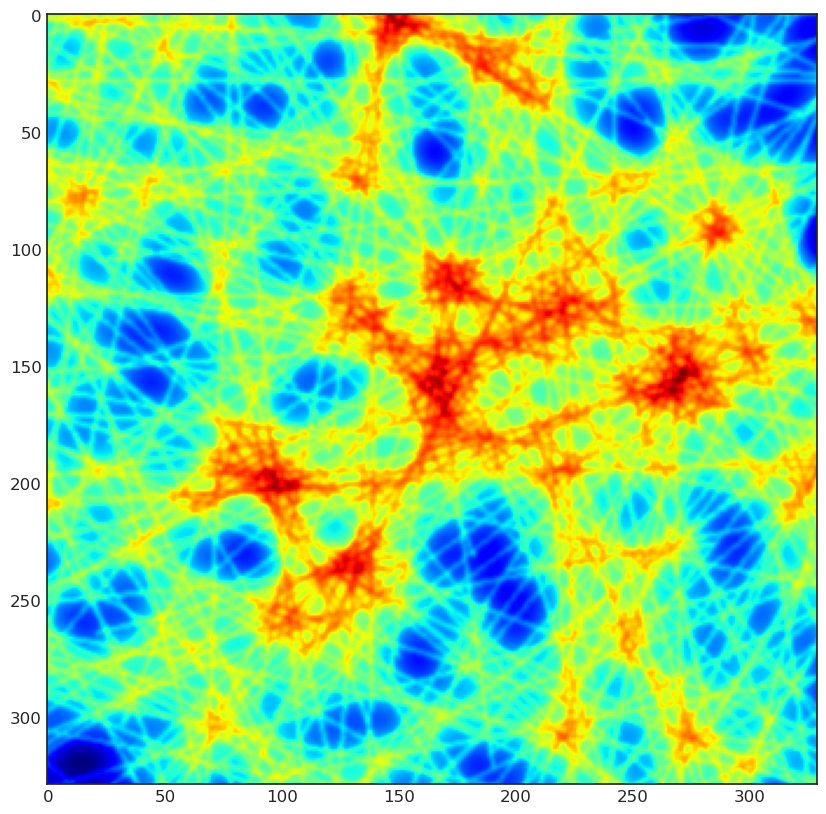

In [38]:
plt.imshow(trim(np.absolute(YY_ground_truth)), cmap = 'jet')

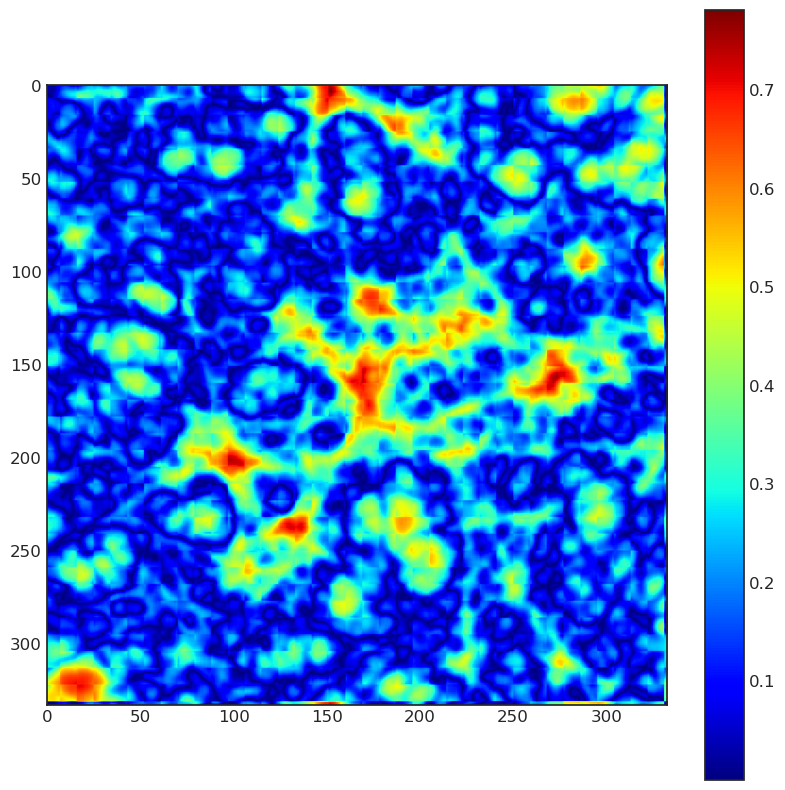

In [39]:
stitched_phase = xyshift(stitch(baseline_overlap_pred_phi[:, :, :, :1], 1), -2, -2)[0]

plt.imshow(stitched_phase, cmap = 'jet')
plt.colorbar()
# plt.title('PtychoNN reconstructed phase')

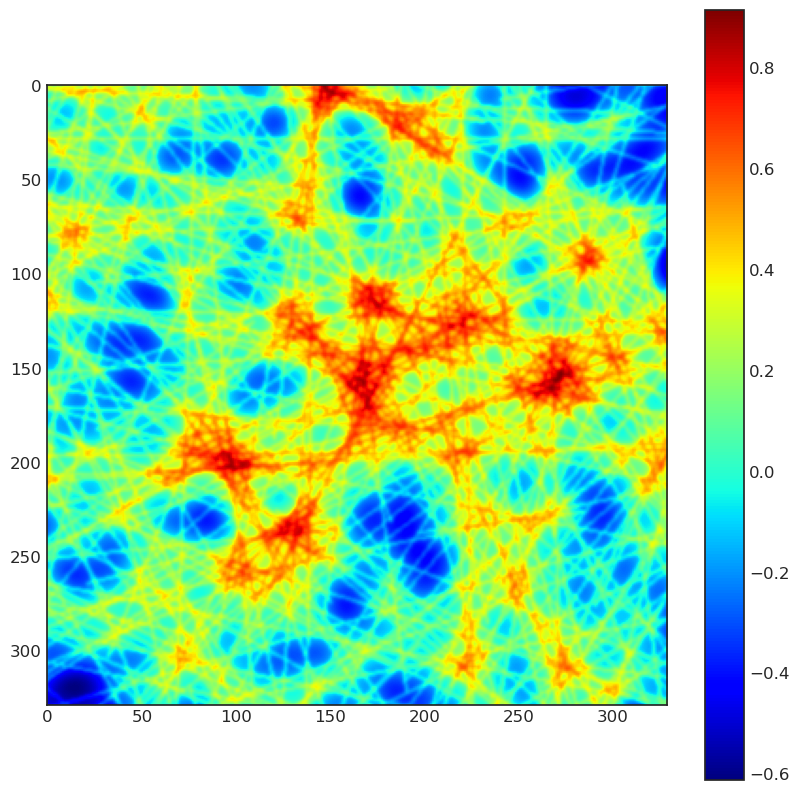

In [41]:
plt.imshow(trim(np.angle(YY_ground_truth)), cmap = 'jet')
plt.colorbar()

## PINN + NLL

In [ ]:
p.cfg['data_source'] = 'lines'
p.cfg['gridsize'] = 1
p.cfg['nll_weight'] = 1.
p.cfg['mae_weight'] = 0.

from ptycho import generate_data as init
reload(init)

# print(p.cfg)
from ptycho.generate_data import *

reload(train.model)
reload(train)
from ptycho.train import *

is test: False
is test: False
is test: False
is test: False
simulating gaussian position jitter, scale 0.0
Sampling on regular grid
is test: False
is test: False
is test: False
is test: False
is test: False
is test: False
simulating gaussian position jitter, scale 0.0
Sampling on regular grid
is test: False
is test: False
0.99998504
nphoton 8.969574
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 64, 64, 1)]  0           []                               
                                                                                                  
 intensity_scaler (IntensitySca  (None, 64, 64, 1)   1           ['input[0][0]']                  
 ler)                                                                                             
                                     

 yScaler_inv)                                                                                     
                                                                                                  
 trimmed_obj (Lambda)           (None, 64, 64, 1)    0           ['padded_obj_2[0][0]']           
                                                                                                  
 distribution_lambda (Distribut  ((None, 64, 64, 1),  0          ['intensity_scaler_inv[0][0]']   
 ionLambda)                      (None, 64, 64, 1))                                               
                                                                                                  
Total params: 1,103,459
Trainable params: 1,099,363
Non-trainable params: 4,096
__________________________________________________________________________________________________
None
offset 4


2023-05-05 20:28:01.988326: I tensorflow/core/profiler/lib/profiler_session.cc:101] Profiler session initializing.
2023-05-05 20:28:01.988338: I tensorflow/core/profiler/lib/profiler_session.cc:116] Profiler session started.


using nominal scan positions for training


2023-05-05 20:28:02.308425: I tensorflow/core/profiler/lib/profiler_session.cc:128] Profiler session tear down.
2023-05-05 20:28:02.308529: I tensorflow/core/profiler/backends/gpu/cupti_tracer.cc:1798] CUPTI activity buffer flushed


Epoch 1/60
732/732 [==============================] - 7s 8ms/step - loss: 18368738.0000 - trimmed_obj_loss: 0.1286 - intensity_scaler_inv_loss: 14.6244 - distribution_lambda_loss: 18368738.0000 - probe_illumination_loss: 0.0282 - val_loss: 7519267.0000 - val_trimmed_obj_loss: 0.1280 - val_intensity_scaler_inv_loss: 12.2608 - val_distribution_lambda_loss: 7519267.0000 - val_probe_illumination_loss: 0.0290 - lr: 0.0010
Epoch 2/60
732/732 [==============================] - 6s 8ms/step - loss: 7327915.0000 - trimmed_obj_loss: 0.1341 - intensity_scaler_inv_loss: 12.0357 - distribution_lambda_loss: 7327915.0000 - probe_illumination_loss: 0.0282 - val_loss: 5704606.5000 - val_trimmed_obj_loss: 0.1332 - val_intensity_scaler_inv_loss: 11.2740 - val_distribution_lambda_loss: 5704606.5000 - val_probe_illumination_loss: 0.0290 - lr: 0.0010
Epoch 3/60
732/732 [==============================] - 5s 7ms/step - loss: 5743679.5000 - trimmed_obj_loss: 0.1428 - intensity_scaler_inv_loss: 11.3683 - distrib

Epoch 21/60
217/732 [=======>......................] - ETA: 3s - loss: 1654840.5000 - trimmed_obj_loss: 0.2073 - intensity_scaler_inv_loss: 7.1661 - distribution_lambda_loss: 1654840.5000 - probe_illumination_loss: 0.0281

In [ ]:
from ptycho import evaluation
evaluation.summarize(40, a, b, X_test, Y_I_test, Y_phi_test, probe.probe, 0)

In [ ]:
d = save_metrics(stitched_obj, YY_ground_truth, label = 'overlaps')
d

In [20]:
mae(trim(YY_ground_truth), trim(reassemble(b)[0])) # PINN, no overlap, 60 epochs, NLL

mean scale adjustment: 0.2773652978898086


0.04122308971125927

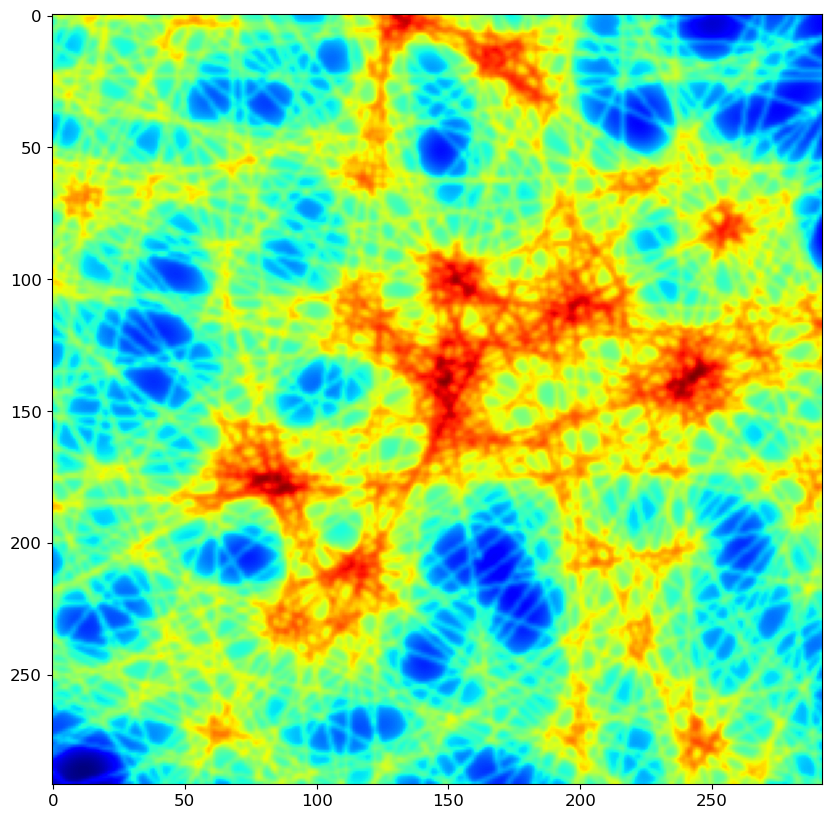

In [43]:
plt.imshow(trim(YY_ground_truth), cmap = 'jet')

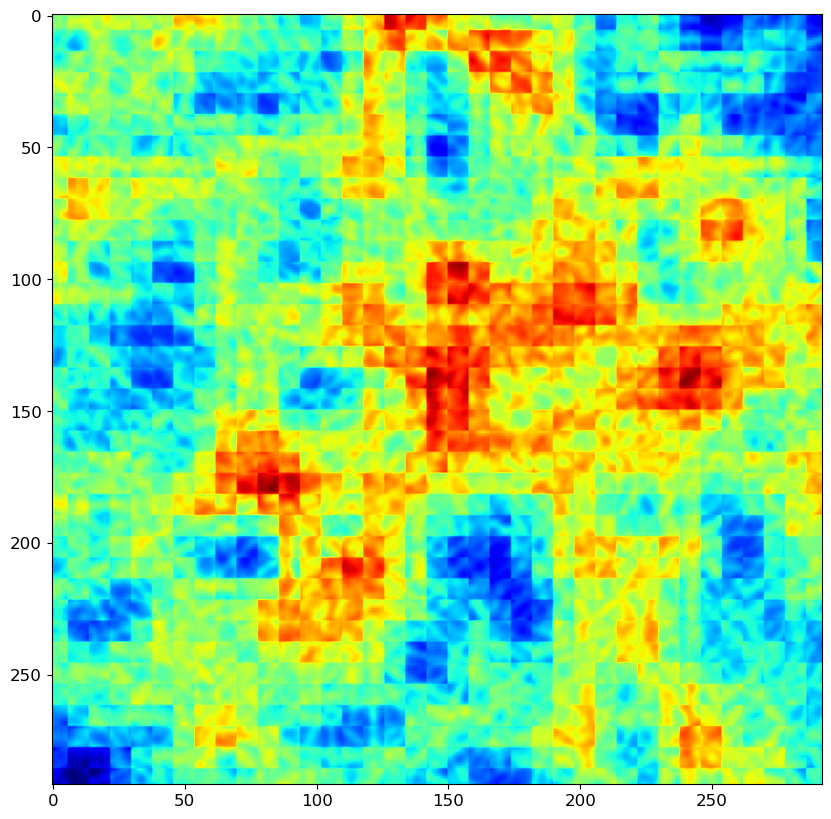

In [44]:
plt.imshow(trim(reassemble(b)[0]), cmap = 'jet')

## PINN, NLL, no overlap:

In [ ]:
mark

In [33]:
from ptycho import train_pinn

In [34]:
p.cfg['gridsize'] = 1
p.cfg['nll_weight'] = 1.
p.cfg['mae_weight'] = 0.

reload(train.model)
# reload(init)
reload(train_pinn)

print(p.cfg)
from ptycho.generate_data import *
from ptycho.train import *

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 64, 64, 1)]  0           []                               
                                                                                                  
 intensity_scaler (IntensitySca  (None, 64, 64, 1)   1           ['input[0][0]']                  
 ler)                                                                                             
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 64)   640         ['intensity_scaler[0][0]']       
                                                                                                  
 conv2d_1 (Conv2D)              (None, 64, 64, 64)   36928       ['conv2d[0][0]']           

                                                                                                  
 distribution_lambda (Distribut  ((None, 64, 64, 1),  0          ['intensity_scaler_inv[0][0]']   
 ionLambda)                      (None, 64, 64, 1))                                               
                                                                                                  
Total params: 4,396,227
Trainable params: 4,392,131
Non-trainable params: 4,096
__________________________________________________________________________________________________
None


2023-05-23 16:40:42.426579: I tensorflow/core/profiler/lib/profiler_session.cc:101] Profiler session initializing.
2023-05-23 16:40:42.426593: I tensorflow/core/profiler/lib/profiler_session.cc:116] Profiler session started.


using nominal scan positions for training


2023-05-23 16:40:42.661943: I tensorflow/core/profiler/lib/profiler_session.cc:128] Profiler session tear down.
2023-05-23 16:40:42.662033: I tensorflow/core/profiler/backends/gpu/cupti_tracer.cc:1798] CUPTI activity buffer flushed


Epoch 1/60
819/819 [==============================] - 11s 12ms/step - loss: 26022154.0000 - trimmed_obj_loss: 0.2039 - intensity_scaler_inv_loss: 16.2006 - distribution_lambda_loss: 26022154.0000 - probe_illumination_loss: 0.0308 - val_loss: 15616886.0000 - val_trimmed_obj_loss: 0.1988 - val_intensity_scaler_inv_loss: 15.0652 - val_distribution_lambda_loss: 15616886.0000 - val_probe_illumination_loss: 0.0308 - lr: 0.0010
Epoch 2/60
819/819 [==============================] - 10s 12ms/step - loss: 9422087.0000 - trimmed_obj_loss: 0.2059 - intensity_scaler_inv_loss: 13.4579 - distribution_lambda_loss: 9422087.0000 - probe_illumination_loss: 0.0308 - val_loss: 7789618.0000 - val_trimmed_obj_loss: 0.2077 - val_intensity_scaler_inv_loss: 13.0329 - val_distribution_lambda_loss: 7789618.0000 - val_probe_illumination_loss: 0.0308 - lr: 0.0010
Epoch 3/60
819/819 [==============================] - 10s 12ms/step - loss: 6506462.5000 - trimmed_obj_loss: 0.2036 - intensity_scaler_inv_loss: 12.0786 -

Epoch 37/60
819/819 [==============================] - 10s 12ms/step - loss: 952786.8125 - trimmed_obj_loss: 0.1812 - intensity_scaler_inv_loss: 5.9315 - distribution_lambda_loss: 952786.8125 - probe_illumination_loss: 0.0308 - val_loss: 1033188.6875 - val_trimmed_obj_loss: 0.1828 - val_intensity_scaler_inv_loss: 6.0801 - val_distribution_lambda_loss: 1033188.6875 - val_probe_illumination_loss: 0.0308 - lr: 1.0000e-04
Epoch 38/60
819/819 [==============================] - 10s 12ms/step - loss: 940214.5000 - trimmed_obj_loss: 0.1824 - intensity_scaler_inv_loss: 5.9026 - distribution_lambda_loss: 940214.5000 - probe_illumination_loss: 0.0308 - val_loss: 1100233.2500 - val_trimmed_obj_loss: 0.1857 - val_intensity_scaler_inv_loss: 6.2364 - val_distribution_lambda_loss: 1100233.2500 - val_probe_illumination_loss: 0.0308 - lr: 1.0000e-04
Epoch 39/60
819/819 [==============================] - 10s 12ms/step - loss: 930985.1250 - trimmed_obj_loss: 0.1839 - intensity_scaler_inv_loss: 5.8768 - di

In [37]:
X_train.shape

(13778, 64, 64, 1)

In [48]:
reload(evaluation)

<module 'ptycho.evaluation' from '/home/ollie/Documents/scratch/ptycho/notebooks/ptycho/evaluation.py'>

phase min: -2.7416372 phase max: 0.67313886


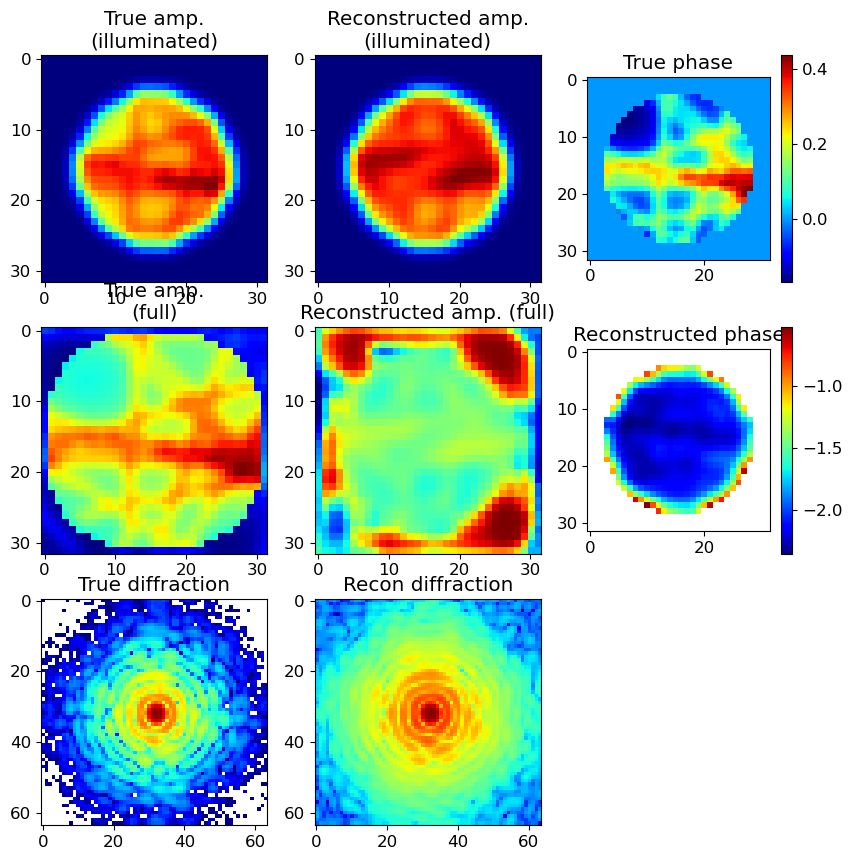

In [67]:
evaluation.summarize(0, train_pinn.pred_amp, train_pinn.reconstructed_obj, X_test, Y_I_test, Y_phi_test, probe.probe, 0);

In [70]:
img_dict_ptychopinn = ptychopinn_heatmaps[0]
img_dict_pinn = pinn_heatmaps[0]

img_dict_pinn.keys()

dict_keys(['true_amp_illuminated', 'rec_amp_illuminated', 'true_phase', 'true_amp_full', 'rec_amp_full', 'rec_phase', 'true_diffraction', 'rec_diffraction'])

In [ ]:
'true_amp_illuminated', 'rec_amp_illuminated', 'true_diffraction', 'rec_diffraction'

phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886
phase min: -2.7416372 phase max: 0.67313886


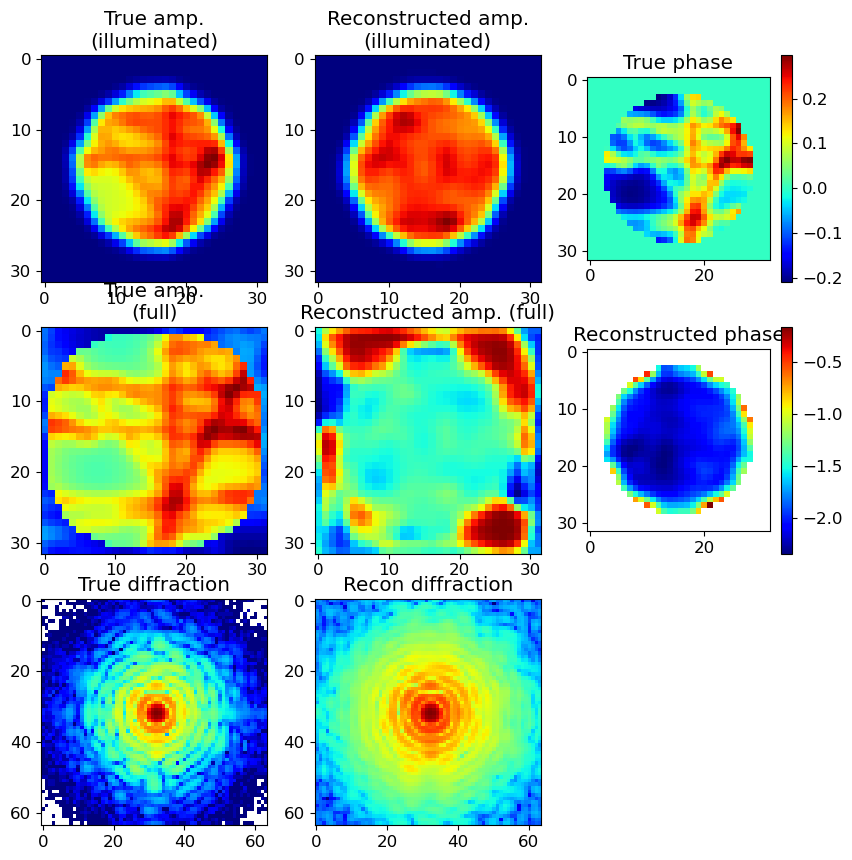

In [50]:
from ptycho import evaluation
pinn_heatmaps = [evaluation.summarize(i, train_pinn.pred_amp, train_pinn.reconstructed_obj, X_test, Y_I_test, Y_phi_test, probe.probe, 0) for i in idxs]

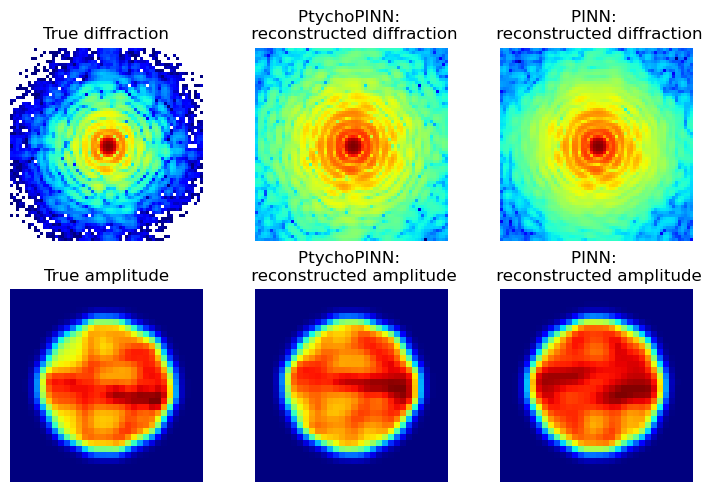

In [81]:
import matplotlib.pyplot as plt
import matplotlib

matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(2, 3, figsize=(7.5, 5))

# Slicing for central 32x32 region
slice_32x32 = slice(img_dict_ptychopinn['true_amp_illuminated'].shape[0]//2 - 16, 
                    img_dict_ptychopinn['true_amp_illuminated'].shape[0]//2 + 16)

# Top row for diffraction
axs[0, 0].imshow(img_dict_ptychopinn['true_diffraction'], cmap='jet')
axs[0, 0].set_title('True diffraction')
axs[0, 0].axis('off')

axs[0, 1].imshow(img_dict_ptychopinn['rec_diffraction'], cmap='jet')
axs[0, 1].set_title('PtychoPINN: \n reconstructed diffraction')
axs[0, 1].axis('off')

axs[0, 2].imshow(img_dict_pinn['rec_diffraction'], cmap='jet')
axs[0, 2].set_title('PINN: \n reconstructed diffraction')
axs[0, 2].axis('off')

# Bottom row for amplitude
axs[1, 0].imshow(img_dict_ptychopinn['true_amp_illuminated'][slice_32x32, slice_32x32], cmap='jet')
axs[1, 0].set_title('True amplitude')
axs[1, 0].axis('off')

axs[1, 1].imshow(img_dict_ptychopinn['rec_amp_illuminated'][slice_32x32, slice_32x32], cmap='jet')
axs[1, 1].set_title('PtychoPINN: \n reconstructed amplitude')
axs[1, 1].axis('off')

axs[1, 2].imshow(img_dict_pinn['rec_amp_illuminated'][slice_32x32, slice_32x32], cmap='jet')
axs[1, 2].set_title('PINN: \n reconstructed amplitude')
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()


In [97]:
true_diffraction.max()

1.3258134

In [99]:
img_dict_ptychopinn['rec_diffraction'].max()

9.162722

7.827130033612823

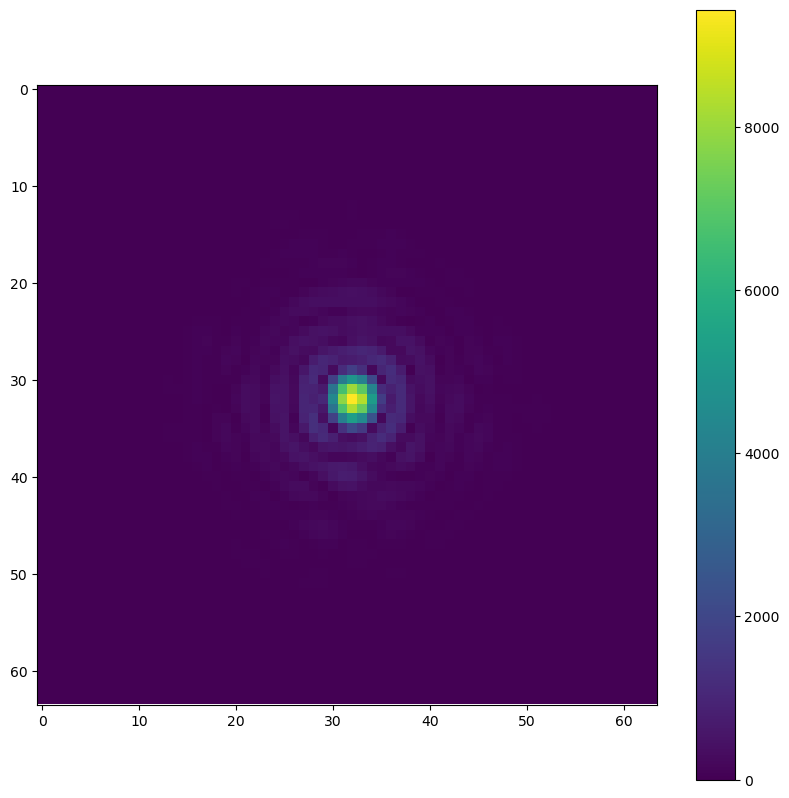

In [110]:
plt.imshow( np.exp(true_diffraction) * intensity_scale)
plt.colorbar()

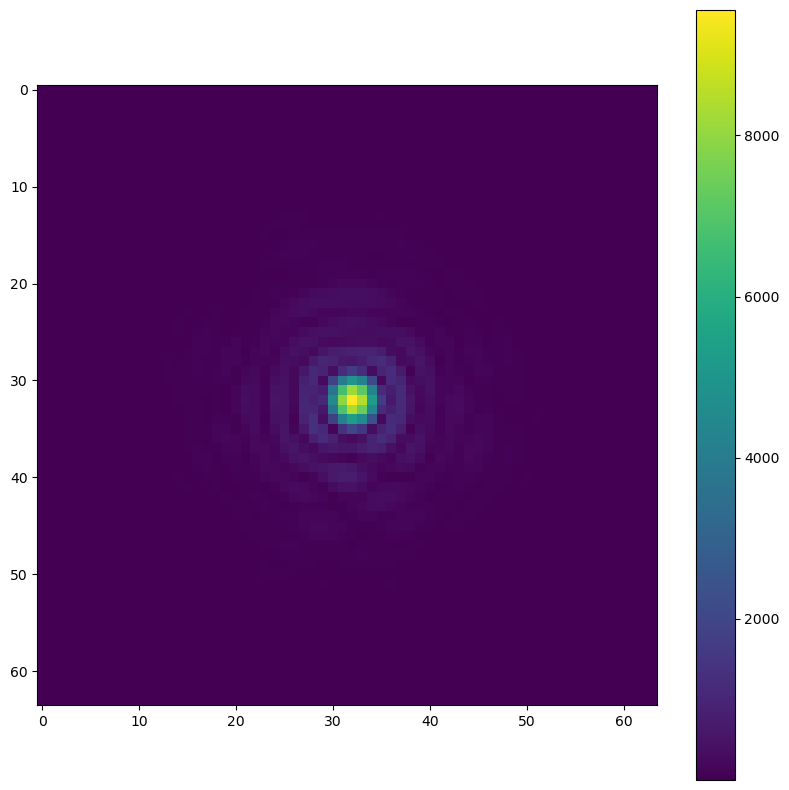

In [111]:
plt.imshow(np.exp(img_dict_pinn['rec_diffraction']))
plt.colorbar()

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern


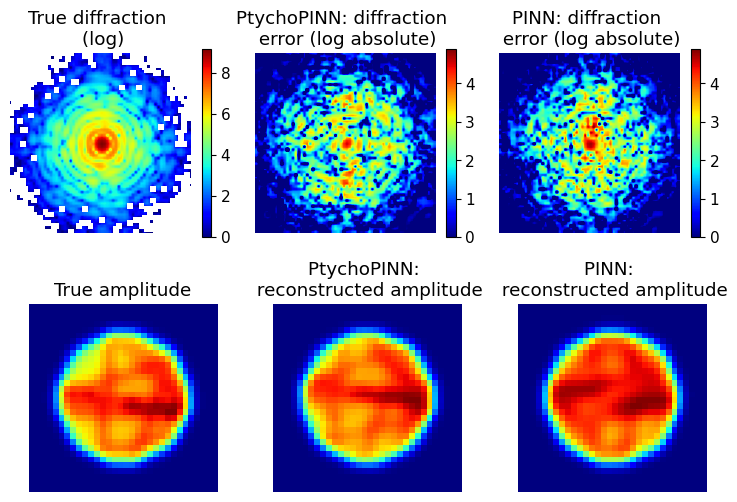

In [125]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

from matplotlib import rcParams

matplotlib.rcParams['font.size'] = 11
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Computer Modern']

fig, axs = plt.subplots(2, 3, figsize=(7.5, 5))

# Slicing for central 32x32 region
slice_32x32 = slice(img_dict_ptychopinn['true_amp_illuminated'].shape[0]//2 - 16, 
                    img_dict_ptychopinn['true_amp_illuminated'].shape[0]//2 + 16)

# Save true_diffraction as a variable for easier subtraction
true_diffraction = img_dict_ptychopinn['true_diffraction']

# Calculate difference for PtychoPINN and PINN

diff_ptychopinn = np.log(
    np.abs(np.exp(img_dict_ptychopinn['rec_diffraction']) - np.exp(true_diffraction) * intensity_scale)
)
diff_pinn = np.log(
    np.abs(np.exp(img_dict_pinn['rec_diffraction']) - np.exp(true_diffraction) * intensity_scale)
)

# Calculate vmin and vmax (use highest non-infinite value if vmax is np.inf)
vmin = 0#np.minimum(np.min(diff_ptychopinn), np.min(diff_pinn))

# Replace np.inf with a large finite number for max
max_ptychopinn = np.max(diff_ptychopinn[np.isfinite(diff_ptychopinn)]) if np.isinf(np.max(diff_ptychopinn)) else np.max(diff_ptychopinn)
max_pinn = np.max(diff_pinn[np.isfinite(diff_pinn)]) if np.isinf(np.max(diff_pinn)) else np.max(diff_pinn)
vmax = np.maximum(max_ptychopinn, max_pinn)

# Top row for diffraction
im1 = axs[0, 0].imshow(true_diffraction + np.log(intensity_scale), cmap='jet')
axs[0, 0].set_title('True diffraction \n (log)')
axs[0, 0].axis('off')
fig.colorbar(im1, ax=axs[0, 0])

im2 = axs[0, 1].imshow(diff_ptychopinn, cmap='jet', vmin=vmin, vmax=vmax)
axs[0, 1].set_title('PtychoPINN: diffraction \n error (log absolute)')
axs[0, 1].axis('off')
fig.colorbar(im2, ax=axs[0, 1])

im3 = axs[0, 2].imshow(diff_pinn, cmap='jet', vmin=vmin, vmax=vmax)
axs[0, 2].set_title('PINN: diffraction \n error (log absolute)')
axs[0, 2].axis('off')
fig.colorbar(im3, ax=axs[0, 2])

# Bottom row for amplitude
axs[1, 0].imshow(img_dict_ptychopinn['true_amp_illuminated'][slice_32x32, slice_32x32], cmap='jet')
axs[1, 0].set_title('True amplitude')
axs[1, 0].axis('off')

axs[1, 1].imshow(img_dict_ptychopinn['rec_amp_illuminated'][slice_32x32, slice_32x32], cmap='jet')
axs[1, 1].set_title('PtychoPINN: \n reconstructed amplitude')
axs[1, 1].axis('off')

axs[1, 2].imshow(img_dict_pinn['rec_amp_illuminated'][slice_32x32, slice_32x32], cmap='jet')
axs[1, 2].set_title('PINN: \n reconstructed amplitude')
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()


In [87]:
vmin

2.976111

In [86]:
vmax

inf

In [47]:
stitched_obj = reassemble(b, part = 'complex')
_, (mae_amp, mae_phi), (mse_amp, mse_phi) = eval_pinn(stitched_obj)
(mae_amp, mae_phi), (mse_amp, mse_phi)

mean scale adjustment: 1.2080139
mean scale adjustment: 1.2080139
mean scale adjustment: 1
mean scale adjustment: 1


((0.036044013, 0.07747234661987067), (0.0021445006, 0.00946497024647823))

In [26]:
mae(trim(YY_ground_truth), trim(reassemble(b)[0])) # PINN, no overlap, 30 epochs, MAE

mean scale adjustment: 0.2822093023953234


0.04197105766831666

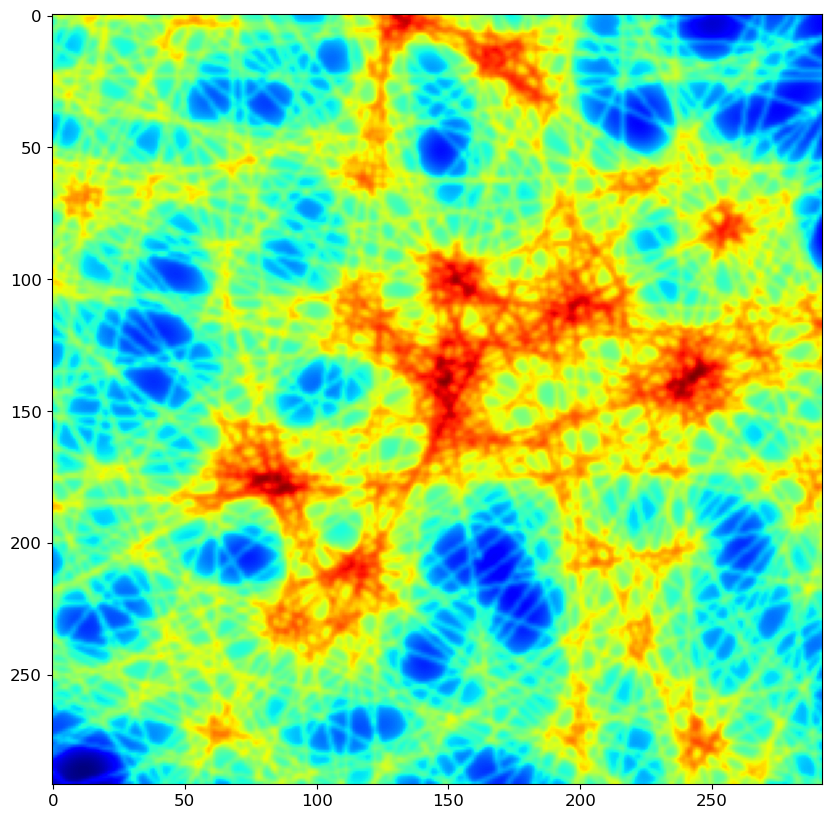

In [48]:
plt.imshow(trim(YY_ground_truth), cmap = 'jet')

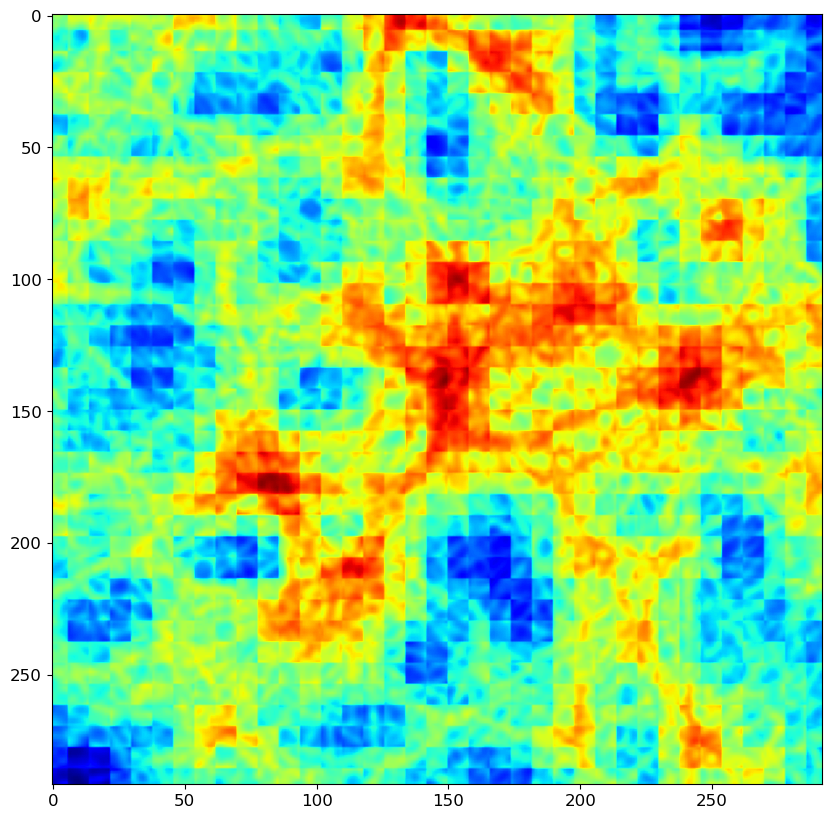

In [49]:
plt.imshow(trim(reassemble(b)[0]), cmap = 'jet')

## PtychoNN (vanilla)

In [14]:
# p.cfg['data_source'] = 'lines'
# p.cfg['gridsize'] = 1
# p.cfg['nll_weight'] = 1.
# p.cfg['mae_weight'] = 0.

# from ptycho import generate_data as init
# reload(init)

# # print(p.cfg)
# from ptycho.generate_data import *

is test: False
is test: False
is test: False
is test: False
simulating gaussian position jitter, scale 0.0
Sampling on regular grid
is test: False
is test: False
is test: False
is test: False
is test: False
is test: False
simulating gaussian position jitter, scale 0.0
Sampling on regular grid
is test: False
is test: False
1.0000024
nphoton 8.969574


In [9]:
from ptycho import params as p
p.cfg['gridsize'] = 1
p.cfg['n_filters_scale'] = 1
p.cfg['set_phi'] = True

from ptycho.generate_data import *

from ptycho import baselines as bl
from ptycho import tf_helper as hh

reload(bl)

baseline_model, history = bl.train((X_train[:, :, :, :1]), Y_I_train[:, :, :, :1], Y_phi_train[:, :, :, :1])

plt.rcParams["figure.figsize"] = (10, 10)

baseline_pred_I, baseline_pred_phi = baseline_model.predict([X_test[:, :, :, 0] * bl.params.params()['intensity_scale']])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 32)   320         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 64, 64, 32)   9248        ['conv2d[0][0]']                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 32, 32, 32)   0           ['conv2d_1[0][0]']               
                                                                                              

2023-08-08 14:19:31.099899: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


400/400 [==============================] - 7s 12ms/step - loss: 0.2284 - conv2d_12_loss: 0.0312 - conv2d_19_loss: 0.1971 - val_loss: 0.1692 - val_conv2d_12_loss: 0.0064 - val_conv2d_19_loss: 0.1628 - lr: 0.0010
Epoch 2/60
400/400 [==============================] - 5s 11ms/step - loss: 0.1681 - conv2d_12_loss: 0.0066 - conv2d_19_loss: 0.1615 - val_loss: 0.1642 - val_conv2d_12_loss: 0.0052 - val_conv2d_19_loss: 0.1590 - lr: 0.0010
Epoch 3/60
400/400 [==============================] - 5s 11ms/step - loss: 0.1630 - conv2d_12_loss: 0.0055 - conv2d_19_loss: 0.1575 - val_loss: 0.1631 - val_conv2d_12_loss: 0.0047 - val_conv2d_19_loss: 0.1584 - lr: 0.0010
Epoch 4/60
400/400 [==============================] - 5s 11ms/step - loss: 0.1611 - conv2d_12_loss: 0.0052 - conv2d_19_loss: 0.1559 - val_loss: 0.1587 - val_conv2d_12_loss: 0.0044 - val_conv2d_19_loss: 0.1543 - lr: 0.0010
Epoch 5/60
400/400 [==============================] - 5s 11ms/step - loss: 0.1596 - conv2d_12_loss: 0.0050 - conv2d_19_loss

TypeError: stitch() got an unexpected keyword argument 'nsegments'

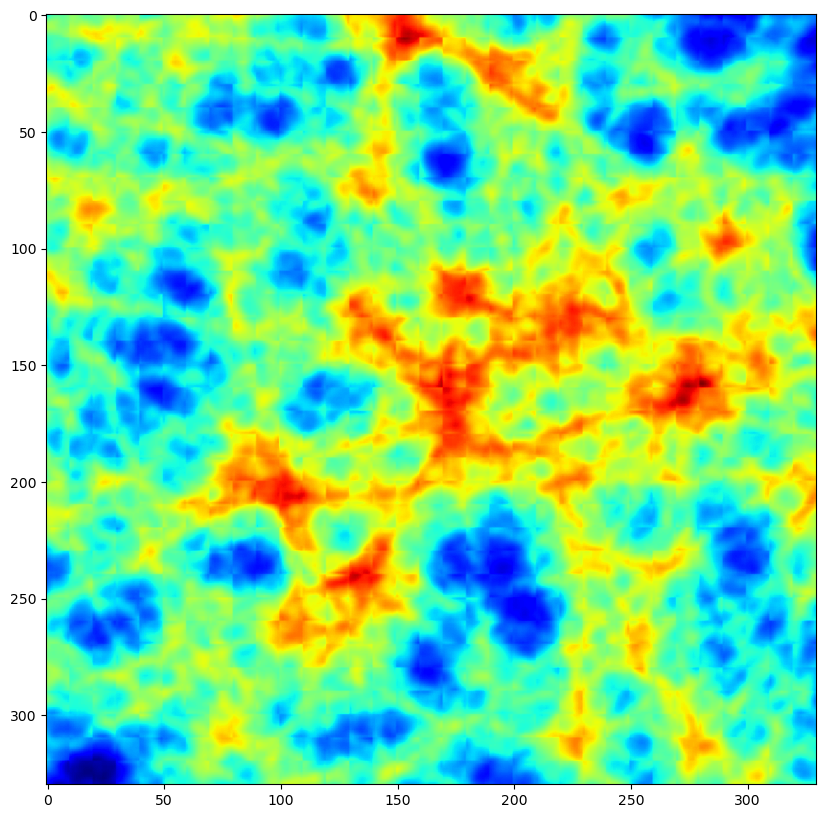

In [11]:
baseline_stitched = stitch(baseline_pred_I, norm_Y_I_test)

plt.imshow(baseline_stitched[0], cmap = 'jet')#, vmin = vmin, vmax = vmax)

In [16]:
YY_baseline = baseline_stitched
YY_phi_baseline = stitch(baseline_pred_phi[:, :, :, :1], 1)
stitched_obj = hh.combine_complex(YY_baseline, YY_phi_baseline)

performed by index method
performed by index method
performed by index method


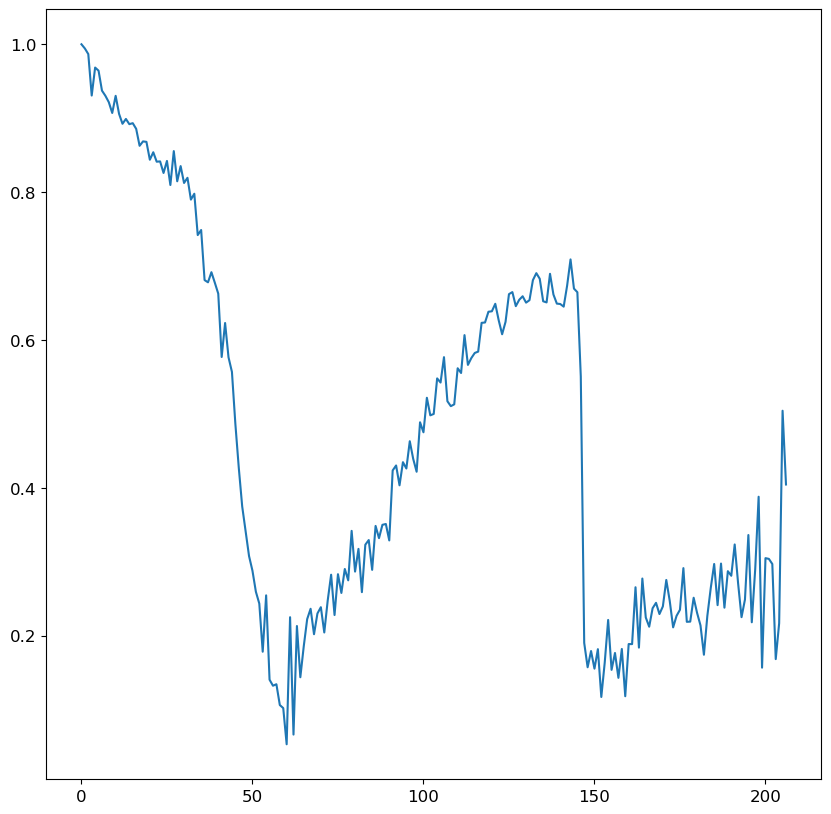

In [17]:
from FRC import fourier_ring_corr as frc

shellcorr = frc.FSC(np.array(trim(stitched_obj[0, :, :, 0])), np.array(trim(YY_ground_truth[:, :, 0])))
plt.plot(shellcorr)

performed by index method
performed by index method
performed by index method
performed by index method
performed by index method
performed by index method


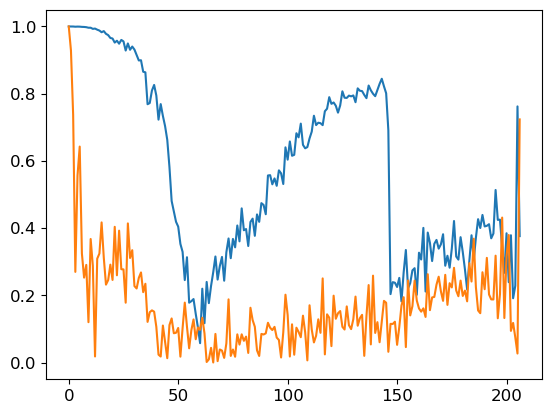

In [23]:
plt.rcParams["figure.figsize"] = (6.4, 4.8)

frc_amp = frc.FSC(np.array(trim(
    np.absolute(stitched_obj[0, :, :, 0]))), np.array(trim(
    np.absolute(YY_ground_truth[:, :, 0]))))
frc_phi = frc.FSC(np.array(trim(
    np.angle(stitched_obj[0, :, :, 0]))), np.array(trim(
    np.angle(YY_ground_truth[:, :, 0]))))

plt.plot(frc_amp)
plt.plot(frc_phi)

In [26]:
np.where(frc_amp < .5)[0][0], np.where(frc_phi < .5)[0][0]

(47, 3)

In [26]:
_, d = evaluation.eval_pinn(stitched_obj, YY_ground_truth)
d

subtracting mean 2.4065757e-06
subtracting mean 0.0
mean scale adjustment: 0.22276287
mean scale adjustment: 0.22276287
performed by index method
performed by index method
performed by index method
mean scale adjustment: 1
mean scale adjustment: 1


{'mae': (0.041109096, 1.1218815e-14),
 'mse': (0.0026446597, 2.5508632e-27),
 'psnr': (40.22341790525453, 314.02582897573944),
 'frc50': (24, nan)}

In [46]:
_, d = eval_pinn(stitched_obj, YY_ground_truth)
d

subtracting mean 0.19597813
subtracting mean 0.20178393
mean scale adjustment: 0.22550765
mean scale adjustment: 0.22550765
mean scale adjustment: 1
mean scale adjustment: 1


{'mae': (0.026146743, 0.13406676),
 'mse': (0.001064368, 0.036174797),
 'psnr': (40.3488615156854, 62.54674274553253)}

In [8]:
_, d = eval_pinn(stitched_obj)
d

mean scale adjustment: 0.22308639
mean scale adjustment: 0.22308639
mean scale adjustment: 1
mean scale adjustment: 1


((0.024859225, 0.12071761073839815), (0.00096223206, 0.028780732978998032))

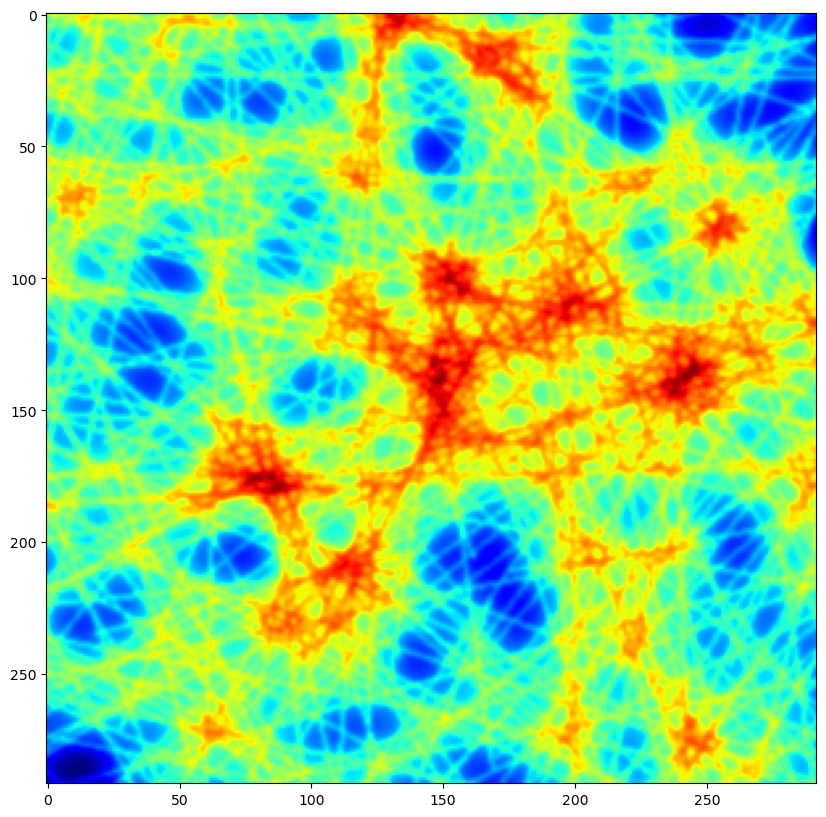

In [10]:
plt.imshow(trim(YY_ground_truth), cmap = 'jet')

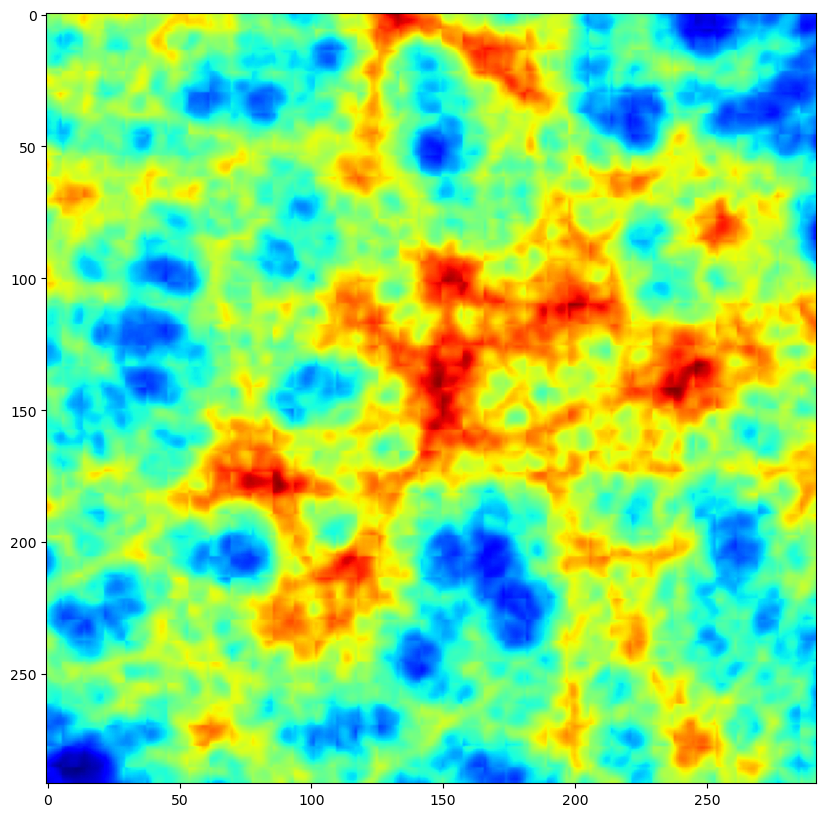

In [11]:
plt.imshow(trim(np.absolute(stitched_obj)[0]), cmap = 'jet')

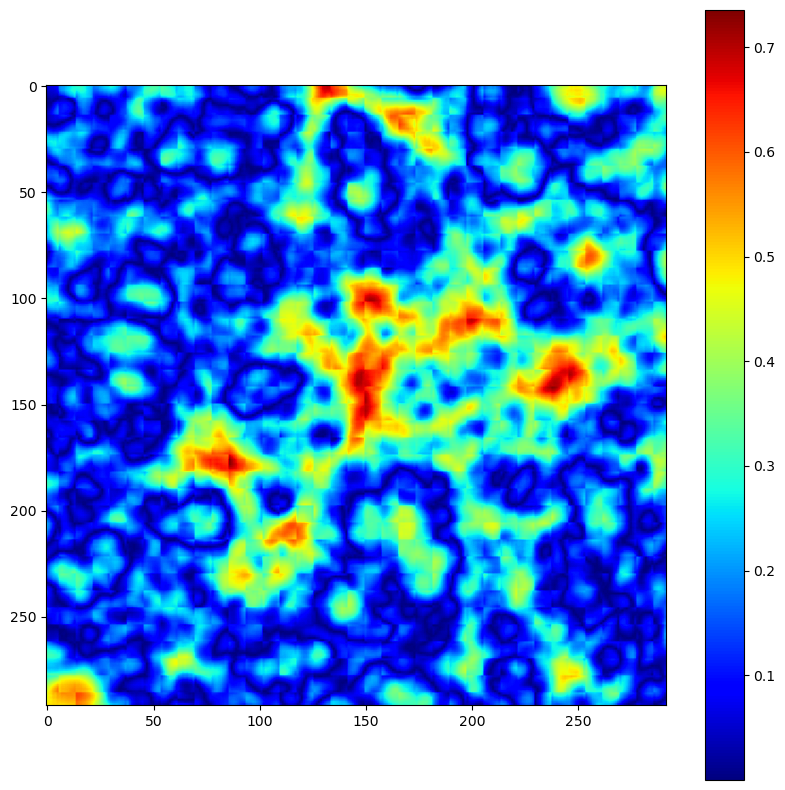

In [14]:
plt.imshow(trim(np.angle(stitched_obj)[0]), cmap = 'jet')
plt.colorbar()

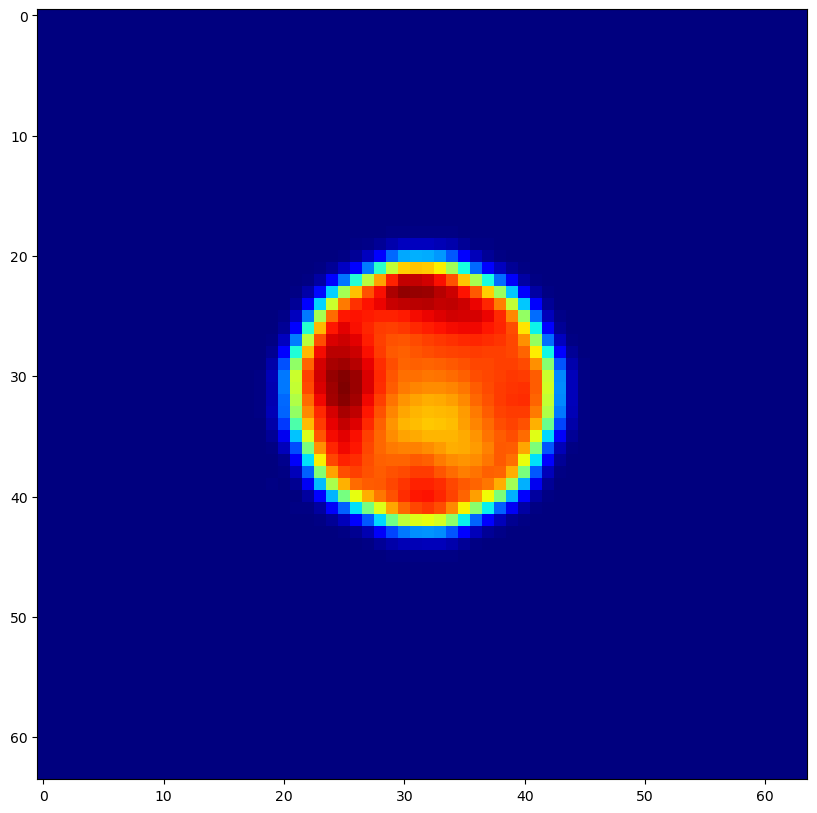

In [13]:
plt.imshow(baseline_pred_I[40], cmap = 'jet')

In [ ]:
# YY_baseline = xyshift(baseline_stitched[0], -2, -2)


In [48]:
def normed_ff_np(arr):
    return (f.fftshift(np.absolute(f.fft2(np.array(arr)))) / np.sqrt(h * w))

In [49]:
from ptycho import fourier as f
from ptycho import tf_helper as hh

/tmp/ipykernel_216449/3066293683.py:18: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(tmp),
/tmp/ipykernel_216449/3066293683.py:22: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(X_train[0, :, :, 0]), cmap = 'jet')


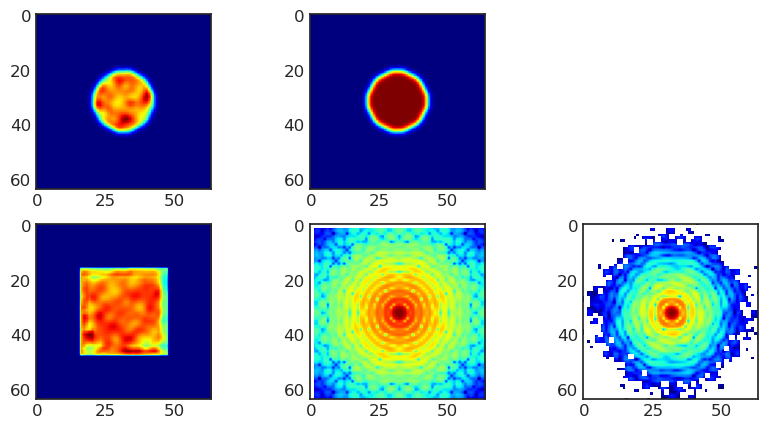

In [50]:
plt.rcParams["figure.figsize"] = (10, 5)


plt.subplot(2, 3, 1)

plt.imshow(Y_I_train[0, :, :, 0], cmap = 'jet')

plt.subplot(2, 3, 2)
plt.imshow(np.absolute(model.autoencoder.variables[-1]), cmap = 'jet')
# plt.colorbar()


plt.subplot(2, 3, 4)
plt.imshow(np.absolute(b[100, :, :, 0]), cmap = 'jet')

plt.subplot(2, 3, 5)
tmp = np.absolute(f.fftshift(f.fft2(np.array(model.autoencoder.variables[-1][:, :, 0]))))
plt.imshow(np.log(tmp),
          cmap  ='jet')

plt.subplot(2, 3, 6)
plt.imshow(np.log(X_train[0, :, :, 0]), cmap = 'jet')

# for i, v in enumerate(model.autoencoder.variables):
#     print(i, v.shape)

In [52]:
from ptycho import baselines as bl
# from ptycho.params import params

In [51]:
YY_I_test_full[0, clipleft: -clipright, clipleft: -clipright].shape, stitched.shape

(TensorShape([296, 296, 1]), (3, 296, 296, 1))

In [55]:
ntake = 1000
nll_pinn = model.fn_poisson_nll(
    X_test[:ntake, :, :, :] * params.params()['intensity_scale'],
    a[:ntake, :, :, :] * params.params()['intensity_scale'])

In [273]:
plt.rcParams["figure.figsize"] = (5, 5)

(0.070346646, 0.14565049)

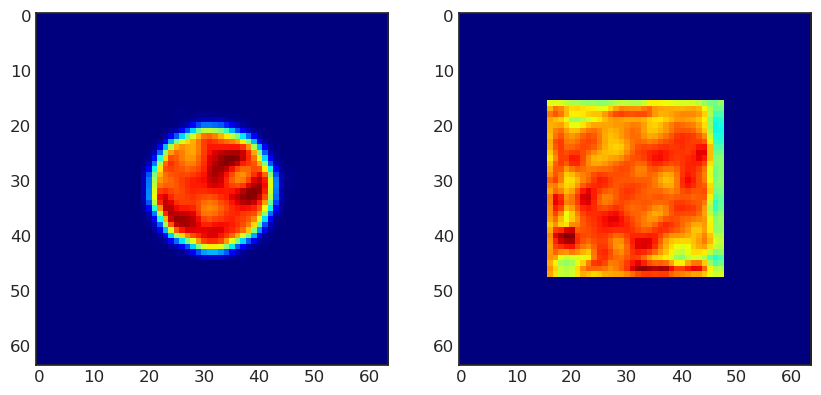

In [53]:
# plt.subplots(1, 2, 2)
plt.subplot(1, 2, 1)
plt.imshow(baseline_pred_I[100, :, :, 0], cmap = 'jet')
plt.subplot(1, 2, 2)
plt.imshow(np.absolute(b[100, :, :, 0]), cmap = 'jet')
baseline_pred_I[100, :, :, 0].mean(), np.mean(np.absolute(b[100, :, :, 0]))

In [183]:
from ptycho import physics
baseline_pred_diff_amplitude = hh.pad_and_diffract(baseline_pred_I, 64, 64, False)[0]

## Evaluation (NLL and MAE)

In [165]:
nll_baseline = model.fn_poisson_nll(
    X_test[:ntake, :, :, :1] * params()['intensity_scale'],
    baseline_pred_diff_amplitude[:ntake, :, :, :] * params()['intensity_scale'])

In [172]:
bopi_flat = hh._channel_to_flat(baseline_overlap_pred_I)
baseline_overlap_pred_diff_amplitude = hh._flat_to_channel(hh.pad_and_diffract(bopi_flat, 64, 64, False)[0])

In [ ]:
nll_baseline_overlap = model.fn_poisson_nll(
    X_test[:ntake, :, :, :] * params()['intensity_scale'],
    baseline_overlap_pred_diff_amplitude[:ntake, :, :, :] * params()['intensity_scale'])

In [206]:
np.mean(nll_baseline_overlap) / (4 * 64 * 64)

588144.6875

In [208]:
np.mean(nll_baseline) / (64 * 64)

587291.25

In [210]:
np.mean(nll_pinn) / (4 * 64 * 64)

92.91577911376953

In [10]:
Itest = (X_test * p.get('intensity_scale'))**2

In [12]:
Itest.shape

TensorShape([4107, 64, 64, 1])

In [17]:
np.max(Itest, axis = 1).max(axis = 1).mean()

100118650.0

/tmp/ipykernel_1142737/2294212082.py:1: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.sqrt(Itest[0, :, :, 0])), cmap = 'jet')


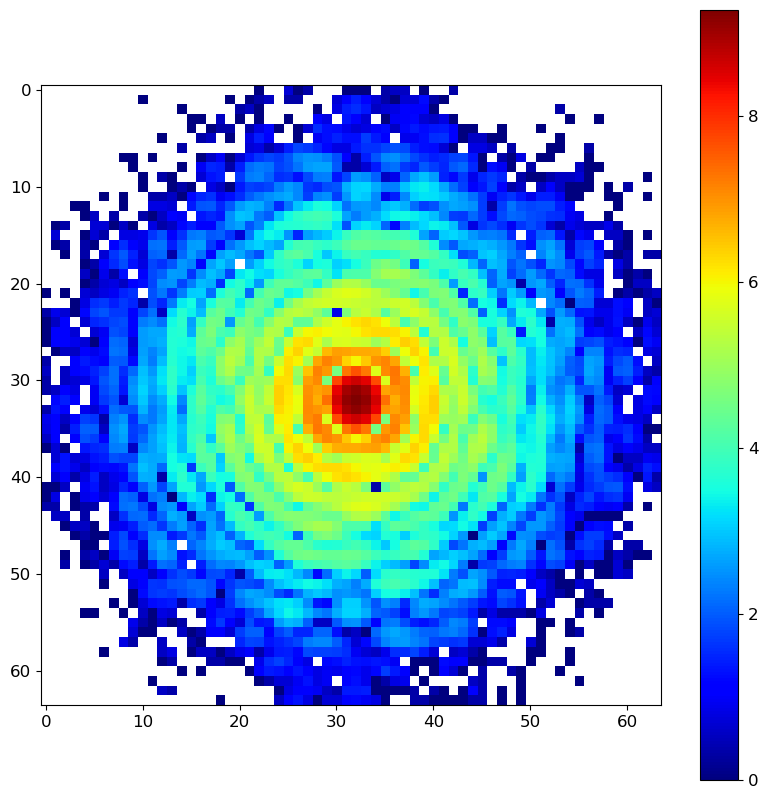

In [22]:
plt.imshow(np.log(np.sqrt(Itest[0, :, :, 0])), cmap = 'jet')
plt.colorbar()

In [57]:
%timeit -n 1 -r 1 baseline_model.predict([X_test[:, :, :, :1]  * model.params()['intensity_scale']])

129/129 [==============================] - 1s 3ms/step
684 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [55]:
%timeit -n 1 -r 1 baseline_model_overlap.predict([X_test[:, :, :, :4]  * model.params()['intensity_scale']])

129/129 [==============================] - 1s 4ms/step
963 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [221]:
# should be close
stitched.mean(), baseline_stitched[0].mean(), baseline_overlap_stitched[0].mean()

(2.8294327, 2.8508396, 2.8469071)

In [42]:
i = 0
# consistency check: should be close to equal
np.sum(tf.math.abs(a[i])**2), np.sum(tf.math.abs(X_test[i])**2),\
np.sum(tf.math.abs(a)**2), np.sum(tf.math.abs(X_test)**2)

(684.1687, 749.7991, 2316089.5, 2534097.2)

## Relative error of diffraction amplitude:

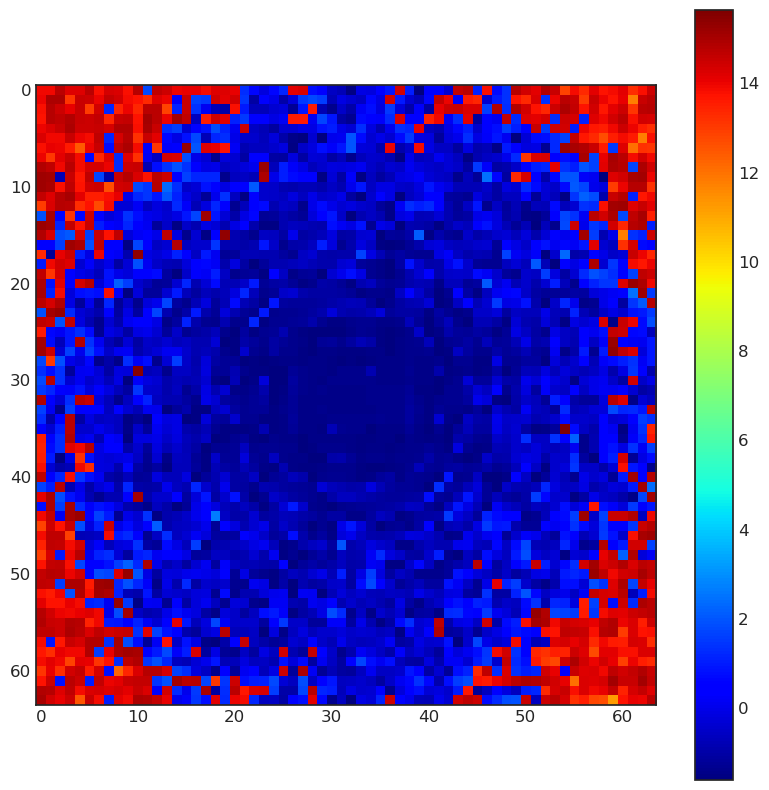

In [43]:
plt.imshow(np.log(.2 + np.abs((a[i, :, :, 0] - X_test[i, :, :, 0]) / (X_test[i, :, :, 0] + 1e-9))), cmap ='jet')
plt.colorbar()

In [45]:
# !ln ../xrd_clustering/notebooks/visualization.py
from ptycho import visualization as vis
reload(vis)

<module 'ptycho.visualization' from '/home/ollie/Documents/scratch/ptycho/notebooks/ptycho/visualization.py'>

diffraction reconstruction


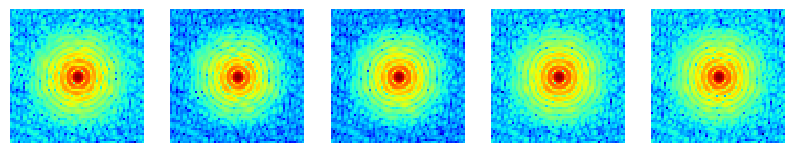

diffraction ground truth


/tmp/ipykernel_2102395/1178352548.py:10: RuntimeWarning: divide by zero encountered in log
  vis.display_imgs(np.log(np.absolute(X_test[:, :, :, 0]))[i:i + off])


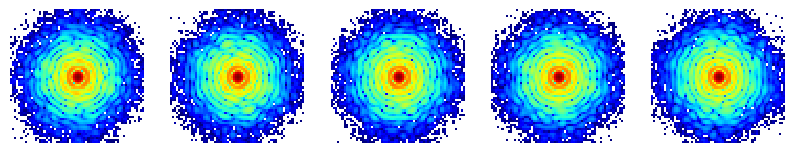

object reconstruction (amp)


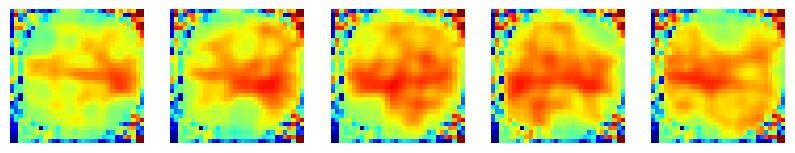

object ground truth


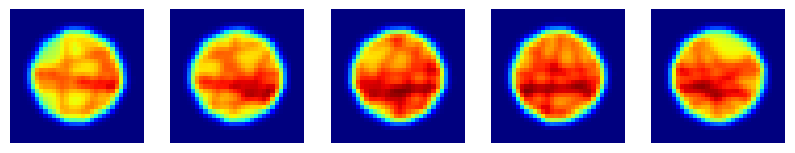

In [46]:
off = 5

vmin = np.min(Y_I_test[:, 16:-16, 16:-16][i:i + off])
vmax = np.max(Y_I_test[:, 16:-16, 16:-16][i:i + off])

print('diffraction reconstruction')
vis.display_imgs(np.log(np.absolute(a[:, :, :, 0]))[i:i + off])

print('diffraction ground truth')
vis.display_imgs(np.log(np.absolute(X_test[:, :, :, 0]))[i:i + off])

print('object reconstruction (amp)')
vis.display_imgs(np.absolute(b[:, 16:-16, 16:-16, 0])[i:i + off], vmin = vmin, vmax = vmax)
# print('object reconstruction (phase)')
# vis.display_imgs(np.angle(b[:, 16:-16, 16:-16, 0])[i:i + 10])#, vmin = vmin, vmax = vmax)
print('object ground truth')
vis.display_imgs(Y_I_test[:, 16:-16, 16:-16, 0][i:i + off], vmin = vmin, vmax = vmax)

In [47]:
# Evaluate resolution

# np.random.seed(2)
# Y_I_2, Y_phi_2, _Y_I_full_2, _ = datasets.simulate_objects(3, size)

# line = np.zeros_like(Y_I_2)
# line[:, 31, :, :] = .1
# line = f.gf(line, (0, 1, 1, 0))


# X_2, Y_I_2, Y_phi_2, _ =\
#     physics.illuminate_and_diffract(Y_I_2 + line, Y_phi_2, probe, intensity_scale = intensity_scale)

# plt.imshow((Y_I_2 - Y_I_test)[0, :, :, 0])
# plt.colorbar()

# b2 = model.diffraction_to_obj([X_2])
# difference = np.real(b2 - model.diffraction_to_obj([X_test])).mean(axis = 0)

# plt.imshow(difference, cmap = 'jet')

# lineout_orig = line[0, :, :, 0].sum(axis = 1)
# lineout_recon = difference[:, :, 0].sum(axis = 1)

## save model

In [48]:
history.history.keys()

dict_keys(['loss', 'trimmed_obj_loss', 'pred_diff_channels_loss', 'distribution_lambda_loss', 'trimmed_obj_1_loss', 'val_loss', 'val_trimmed_obj_loss', 'val_pred_diff_channels_loss', 'val_distribution_lambda_loss', 'val_trimmed_obj_1_loss', 'lr'])

In [50]:
# np.save(path+'str_history2', history.history)

In [251]:
# model.load_weights(checkpoint_filepath)

In [68]:
# autoencoder.save('{}.h5'.format(wt_path))